**Bayesian Optimisation for hyperparameter configuration**

**Set random seed for reproducability**

In [1]:
import os
import numpy as np 
import tensorflow as tf
randseed = 42
np.random.seed(randseed)
tf.random.set_seed(randseed)
os.environ['PYTHONHASHSEED']=str(randseed)

**Import packages**

In [2]:
import pandas as pd 
import matplotlib.pyplot as plt 
from keras import backend as K
from keras.models import Sequential, load_model 
from keras.layers import Dense, Dropout, GRU 
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler  
from sklearn.metrics import  mean_squared_error, mean_absolute_error, r2_score
import skopt
from skopt import gp_minimize
from skopt.utils import use_named_args
from skopt.space import Real, Categorical, Integer

**Read in dataset**

In [3]:
#Read in the Dataset
original = pd.read_csv('/kaggle/input/stocks/RLO.csv') 
original['Date'] = pd.to_datetime(original.Date) 
original.head()

,Date,Open,High,Low,Close,Volume,Earnings Yield (EY),Dividend Yield (DY),P:E Ratio (P:E),Trades,Trade Value,Total Return Index (TRI)
0,1999-01-01,820,820,790,820,0,12.9,5.2,7.751938,0,0,596.493392
1,1999-01-04,810,810,799,800,71078,13.2,5.4,7.575758,0,0,581.944773
2,1999-01-05,800,805,800,800,192045,13.2,5.4,7.575758,0,0,581.944773
3,1999-01-06,800,810,800,805,133226,13.1,5.3,7.633588,0,0,585.581928
4,1999-01-07,805,815,795,800,119676,13.2,5.4,7.575758,0,0,581.944773


**Feature Engineering:**

*   Variations of Log Returns
*   Total Return Index (TRI)
*   Simple Moving Average (SMA) - 20, 50, 200 days
*   Exponentially-weighted Moving Average (EWMA) - 20, 50, 200 days
*   Moving Average Convergence Divergence (MACD)
*   Relative Strength Index (RSI) - 14 days
*   Moving Average Convergence Divergence (MACD)

In [4]:
forecastHorizon = 5

#Create new dataframe
df = pd.DataFrame(data = original['Date'])  

#Target Returns (Weekly)
df['Target'] = np.log(original['Close'].shift(-forecastHorizon) / original['Close'])

#Returns from the closing price
df['Returns'] = np.log((original['Close']) / original['Close'].shift(forecastHorizon))

#Lagged Variations of returns
df['Returns1'] = np.log((original['Close']) / original['Close'].shift(1))
df['Returns2'] = np.log((original['Close']) / original['Close'].shift(2))
df['Returns3'] = np.log((original['Close']) / original['Close'].shift(3))
df['Returns4'] = np.log((original['Close']) / original['Close'].shift(4))

#Simple Moving Average (SMA) and Exponentially-weighted Moving Average (EWMA) - 5, 10, 20, 50, 200 days
numDays = 5
df['SMA (5)'] = df['Returns'].rolling(numDays).mean()
df['EWMA (5)'] = df['Returns'].ewm(span = numDays, min_periods = numDays).mean() 

numDays = 10
df['SMA (10)'] = df['Returns'].rolling(numDays).mean()
df['EWMA (10)'] = df['Returns'].ewm(span = numDays, min_periods = numDays).mean() 

numDays = 20
df['SMA (20)'] = df['Returns'].rolling(numDays).mean()
df['EWMA (20)'] = df['Returns'].ewm(span = numDays, min_periods = numDays).mean() 

numDays = 50
df['SMA (50)'] = df['Returns'].rolling(numDays).mean()
df['EWMA (50)'] = df['Returns'].ewm(span = numDays, min_periods = numDays).mean() 

numDays = 200
df['SMA (200)'] = df['Returns'].rolling(numDays).mean()
df['EWMA (200)'] = df['Returns'].ewm(span = numDays, min_periods = numDays).mean() 

#Relative Strength Index (RSI)
numDays = 14
diff = original['Close'].diff(1)
up, down = diff.copy(), diff.copy()
up[up < 0] = 0
down[down > 0] = 0
EWMAu = up.ewm(span = numDays, min_periods = numDays).mean()
EWMAd = down.abs().ewm(span = numDays, min_periods = numDays).mean()
RS = EWMAu / EWMAd
df['RSI'] = 100.0 - (100.0 / (1.0 + RS))

#Moving Average Convergence Divergence (MACD)
df['MACD'] = df['Returns'].ewm(span = 12, min_periods = 12).mean()  - df['Returns'].ewm(span = 26, min_periods = 26).mean() 

#Commodity Channel Index (CCI) 
df['Typical Price'] = (original['High'] + original['Low'] + original['Close']) / 3
numDays = 20
df['CCI'] = (df['Typical Price'] - df['Typical Price'].rolling(numDays).mean()) / (0.015 * df['Typical Price'].rolling(numDays).std())

#Stochastic Oscillator (SO)
numDays = 14
df['SO'] = ((df['Returns'] - df['Returns'].rolling(numDays).min()) / (df['Returns'].rolling(numDays).max() - df['Returns'].rolling(numDays).min())) * 100

#Variations of Returns
df['TRI'] = np.log(original['Total Return Index (TRI)'] / original['Total Return Index (TRI)'].shift(forecastHorizon))
df['Returns Open'] = np.log(original['Open'] / original['Open'].shift(forecastHorizon))
df['Returns Low'] = np.log(original['Low'] / original['Low'].shift(forecastHorizon))
df['Returns High'] = np.log(original['High'] / original['High'].shift(forecastHorizon))
df['Returns High/Open'] = np.log(original['High'] / original['Open'].shift(forecastHorizon))
df['Returns High/Low'] = np.log(original['High'] / original['Low'].shift(forecastHorizon))
df['Returns High/Close'] = np.log(original['High'] / original['Close'].shift(forecastHorizon))
df['Returns Close/Open'] = np.log(original['Close'] / original['Open'].shift(forecastHorizon))
df['Returns Close/Low'] = np.log(original['Close'] / original['Low'].shift(forecastHorizon))
df['Returns Close/High'] = np.log(original['Close'] / original['High'].shift(forecastHorizon))
df['Returns Open/Low'] = np.log(original['Open'] / original['Low'].shift(forecastHorizon))
df['Typical Price'] = np.log(df['Typical Price'] / df['Typical Price'].shift(forecastHorizon))

#Set date to index
df.index = df['Date'] 

#Drop columns that aren't needed
df.drop(['Date'], axis=1, inplace=True)

#Drop NaNs
df = df.dropna()

df.head()

,Target,Returns,Returns1,Returns2,Returns3,Returns4,SMA (5),EWMA (5),SMA (10),EWMA (10),...,Returns Open,Returns Low,Returns High,Returns High/Open,Returns High/Low,Returns High/Close,Returns Close/Open,Returns Close/Low,Returns Close/High,Returns Open/Low
Date,,,,,,,,,,,,,,,,,,,,,
1999-10-14,-0.444461,0.028524,0.005640,0.012451,0.015873,0.033165,0.037491,0.041125,0.070066,0.049895,...,0.039221,0.034686,0.028492,0.045985,0.045985,0.029649,0.044861,0.044861,0.027368,0.039221
1999-10-15,-0.437964,0.000000,-0.033165,-0.027525,-0.020714,-0.017291,0.027966,0.027417,0.053958,0.040823,...,0.028524,0.000000,0.011300,0.029649,0.034289,0.034289,-0.004640,0.000000,-0.022990,0.033165
1999-10-18,-0.062242,-0.411196,-0.393904,-0.427069,-0.421429,-0.414618,-0.062438,-0.118787,-0.005394,-0.041362,...,-0.371564,-0.458575,-0.388658,-0.371564,-0.371564,-0.377294,-0.405465,-0.405465,-0.422560,-0.371564
1999-10-19,-0.026202,-0.414618,0.000000,-0.393904,-0.427069,-0.421429,-0.150670,-0.217398,-0.053505,-0.109227,...,-0.412338,-0.429730,-0.419610,-0.403754,-0.403754,-0.406035,-0.412338,-0.412338,-0.428193,-0.412338
1999-10-20,0.017392,-0.438821,-0.017392,-0.017392,-0.411296,-0.444461,-0.247222,-0.291205,-0.100022,-0.169153,...,-0.414618,-0.432010,-0.405465,-0.397524,-0.397524,-0.404335,-0.432010,-0.432010,-0.439951,-0.414618


**Model Helper Functions**

In [5]:
def split(dataset, sequencelength, features, scaler, start, trainingSize, validationSize, testingSize, end):
  '''
  Function to split the data into a window required for Keras RNNs
  @params:
    dataset - data to be used
    sequencelength - Number of datapoints in a single input sequence
    features - Number of features in the dataset
    scaler - Initialised MinMaxScaler
    start - First datapoint index
    trainingSize - Size of the training set
    validationSize - Size of the validation set
    testingSize - Size of the testing set
    end - Last datapoint index
  @returns:
    scaler - Scaler that is fit on the training data
    x_train - Scaled Training input 
    y_train - Scaled Training output 
    y_trainUnscaled - Unscaled training output 
    x_val - Scaled validation input 
    y_val - Scaled validation output 
    y_valUnscaled - Unscaled validation output 
    x_test - Scaled testing input 
    y_test - Unscaled testing output 
  '''
  #Extracting target variables for the test and train set
  train = scaler.fit_transform(dataset[start - sequencelength : start + trainingSize, :])
  unscaled_train = dataset[start - sequencelength : start + trainingSize , 0]

  x_train = []
  y_train = []
  y_trainUnscaled = []
  for i in range(sequencelength, len(train)):
    x_train.append(train[i - sequencelength + 1 : i + 1, 1:])
    y_train.append(train[i, 0])
    y_trainUnscaled.append(unscaled_train[i])

  x_train = np.array(x_train)
  x_train = x_train.reshape((x_train.shape[0], sequencelength, features))
  y_train = np.array(y_train)
  y_trainUnscaled = np.array(y_trainUnscaled)

  #Splitting the validation set into input and output arrays
  val = scaler.transform(dataset[start + trainingSize - sequencelength : end - testingSize, :])
  unscaled_val = dataset[start + trainingSize - sequencelength : end - testingSize , 0]

  x_val = []
  y_val = []
  y_valUnscaled = []
  for i in range(sequencelength, len(val)):
    x_val.append(val[i - sequencelength + 1 : i + 1, 1:])
    y_val.append(val[i, 0])
    y_valUnscaled.append(unscaled_val[i])

  x_val = np.array(x_val)
  x_val = x_val.reshape((x_val.shape[0], sequencelength, features))
  y_val = np.array(y_val)
  y_valUnscaled = np.array(y_valUnscaled)

  #Splitting the testing set into input an array
  test = scaler.transform(dataset[start + trainingSize + validationSize - sequencelength : end, :])
  unscaled_test = dataset[start + trainingSize + validationSize - sequencelength : end, 0]

  x_test = []
  y_test = []
  for i in range(sequencelength, len(test)):
    x_test.append(test[i - sequencelength + 1 : i + 1, 1:])
    y_test.append(unscaled_test[i])

  x_test = np.array(x_test) 
  x_test = x_test.reshape((x_test.shape[0], sequencelength, features))
  y_test = np.array(y_test)

  return scaler, x_train, y_train, y_trainUnscaled, x_val, y_val, y_valUnscaled, x_test, y_test

def makePredictions(model, x_train, x_val, x_test, sequencelength, scaler):
  '''
  Performs inference using the model
  @params:
    model - LSTM or GRU (Keras Framework)
    x_train - Training input data
    x_val - Validation input data
    x_test - Testing input data
    sequencelength - Input sequence length
    scaler - MinMaxScaler used to scale the data
  @returns:
    trainingPredictions - Training set predictions
    valPredictions - Validation set predictions
    testingPredictions - Testing set predictions
  '''
  #Forecasts on training set
  temp = x_train
  trainingPredictions = model.predict(x_train)
  temp = temp.reshape((temp.shape[0], sequencelength * features))
  invPred = np.concatenate((trainingPredictions, temp[:,:features]), axis=1)
  trainingPredictions = scaler.inverse_transform(invPred)[:,0]
  trainingPredictions = trainingPredictions.reshape((trainingPredictions.shape[0], 1))

  #Forecasts on validation set
  temp = x_val
  valPredictions = model.predict(x_val)
  temp = temp.reshape((temp.shape[0], sequencelength * features))
  invPred = np.concatenate((valPredictions, temp[:,:features]), axis=1)
  valPredictions = scaler.inverse_transform(invPred)[:,0]
  valPredictions = valPredictions.reshape((valPredictions.shape[0], 1))

  #Forecasts on test set
  temp = x_test
  testingPredictions = model.predict(x_test)
  temp = temp.reshape((temp.shape[0], sequencelength * features))
  invPred = np.concatenate((testingPredictions, temp[:,:features]), axis=1)
  testingPredictions = scaler.inverse_transform(invPred)[:,0]
  testingPredictions = testingPredictions.reshape((testingPredictions.shape[0], 1))

  return trainingPredictions, valPredictions, testingPredictions

**Parameters for the dataset split**

In [6]:
dataset = df.values
totaldatapoints = len(dataset)
features = len(df.columns) - 1

**Setting up hyperparameter ranges**

In [7]:
dim_learning_rate = Real(low=1e-4, high=1e-2, prior='log-uniform', name='learning_rate')
dim_num_input_nodes = Integer(low=5, high=256, name='num_input_nodes')
dim_dropout = Real(low=0.0,high=0.25,name='dropout')
dim_sequence_length = Integer(low=100, high=200, name='sequence_length')
dim_batch_size = Integer(low=1, high=250, name='batch_size')

dimensions = [dim_learning_rate,
              dim_num_input_nodes,
              dim_dropout,
              dim_sequence_length,
              dim_batch_size]

default_parameters = [3e-4, 256, 0.2, 200, 32]

**GRU initialisation based on current set of hyperparameters**

In [8]:
def gru(learning_rate, num_input_nodes, dropout, sequence_length):
  '''
  Create GRU
  @params: 
    learning_rate - Adam learning rate
    num_input_nodes - Number of GRU cells in the layers
    dropout - dropout regularisation
    sequence_length - Length of the input sequence length
  @returns:
    model - Compiled GRU
  '''
  #Construct GRU
  model = Sequential()
  model.add(GRU(units=num_input_nodes, return_sequences=True, input_shape=(sequence_length, features)))
  model.add(GRU(units=num_input_nodes, dropout=dropout))
  model.add(Dense(1))

  adam = Adam(lr=learning_rate, amsgrad=True)
  model.compile(optimizer=adam, loss='mae', metrics=['mse','mae','mape'])
  return model

**Train GRU with current hyperparameters**

In [9]:
@use_named_args(dimensions=dimensions)
def fitness(learning_rate, num_input_nodes, dropout, sequence_length, batch_size):
  '''
  Used in the Bayesian Optimisation Procedure
  @params:
    learning_rate - Adam learning rate
    num_input_nodes - Number of GRU cells in the layers
    dropout - dropout regularisation
    sequence_length - Length of the input sequence length
    batch_size - Model batch size
  @returns:
    mse - Mean squared Error using current hyperparameters
  '''
  #Get train, val, test split
  #Window Variables
  start = 0 + sequence_length
  trainingSize = 1000
  validationSize = 100
  testingSize = 150
  end = start + trainingSize + validationSize + testingSize + sequence_length

  #Get Data split
  scaler = MinMaxScaler(feature_range=(-1, 1))
  scaler, x_train, y_train, y_trainUnscaled, x_val, y_val, y_valUnscaled, x_test, y_test = split(dataset, sequence_length, features, scaler, start, trainingSize, validationSize, testingSize, end)
  
  print()
  print('learning rate: {}'.format(learning_rate))
  print('num_input_nodes: {}'.format(num_input_nodes))
  print('dropout: {}'.format(dropout))
  print('sequence_length : {}'.format(sequence_length))
  print('batch_size: {}'.format(batch_size))
  print()

  model = gru(learning_rate=learning_rate,
               num_input_nodes=num_input_nodes,
               dropout=dropout,
               sequence_length=sequence_length)
  
  es = EarlyStopping(monitor='val_loss', mode='min', verbose=0, patience=20)
  mc = ModelCheckpoint('./GRU.h5', monitor='val_loss', mode='min', verbose=0, save_best_only=True)
  blackbox = model.fit(x_train, y_train,  batch_size=batch_size, epochs=150, verbose=0, validation_data = (x_val, y_val), callbacks=[es, mc])
  model = load_model('./GRU.h5')
  
  _, _, testingPredictions = makePredictions(model, x_train, x_val, x_test, sequence_length, scaler)

  #Plot graph of forecasts
  testGraph = pd.DataFrame(df[start + trainingSize + validationSize : end])
  testGraph['Test Predictions'] = testingPredictions
  testGraph['Test Actual'] = y_test

  plt.figure(figsize=(16,8))
  plt.plot(testGraph['Test Actual'], label='True values')
  plt.plot(testGraph['Test Predictions'], label = 'Predicted Values')
  plt.title("Result")
  plt.legend(loc = 'best')
  plt.show()

  #Get mse on the test set
  mse = mean_squared_error(y_test, testingPredictions)

  # Print the classification accuracy.
  print()
  print("MSE: {}".format(mse))
  print()

  del model
  K.clear_session()
  tf.compat.v1.reset_default_graph()
  return mse

**Bayesian Optimisation**

Iteration No: 1 started. Evaluating function at provided point.

learning rate: 0.0003
num_input_nodes: 256
dropout: 0.2
sequence_length : 200
batch_size: 32



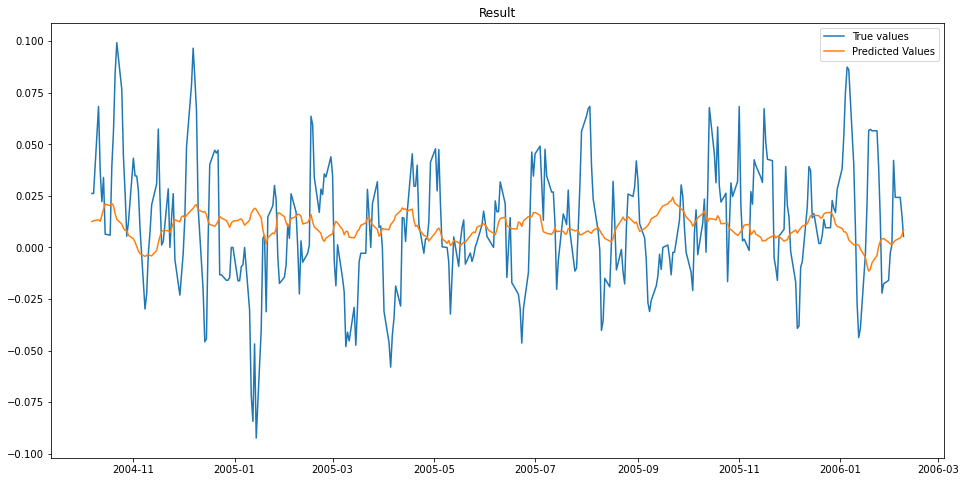


MSE: 0.0009384678970679831

Iteration No: 1 ended. Evaluation done at provided point.
Time taken: 37.9666
Function value obtained: 0.0009
Current minimum: 0.0009
Iteration No: 2 started. Evaluating function at random point.

learning rate: 0.003918194347141745
num_input_nodes: 51
dropout: 0.19492275006819237
sequence_length : 160
batch_size: 112



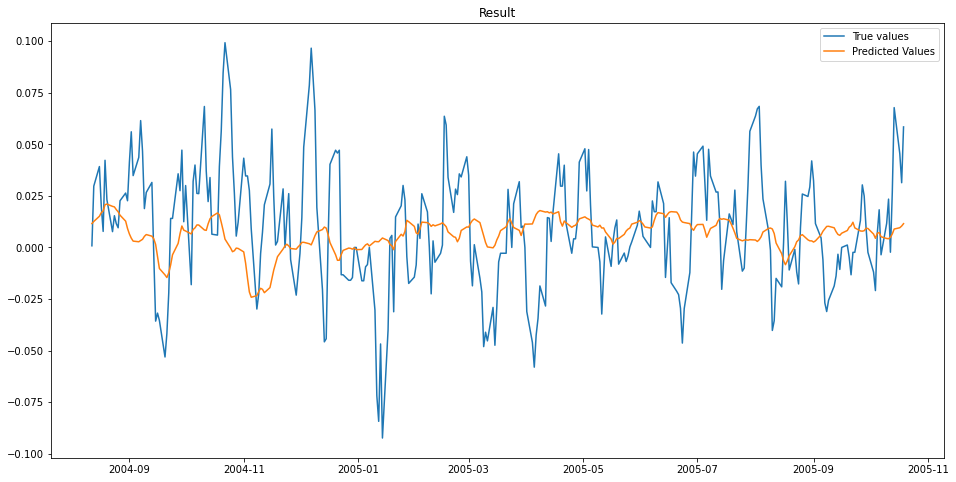


MSE: 0.0009327163759095534

Iteration No: 2 ended. Evaluation done at random point.
Time taken: 13.0471
Function value obtained: 0.0009
Current minimum: 0.0009
Iteration No: 3 started. Evaluating function at random point.

learning rate: 0.00015847101210439096
num_input_nodes: 120
dropout: 0.08342715278475547
sequence_length : 114
batch_size: 163



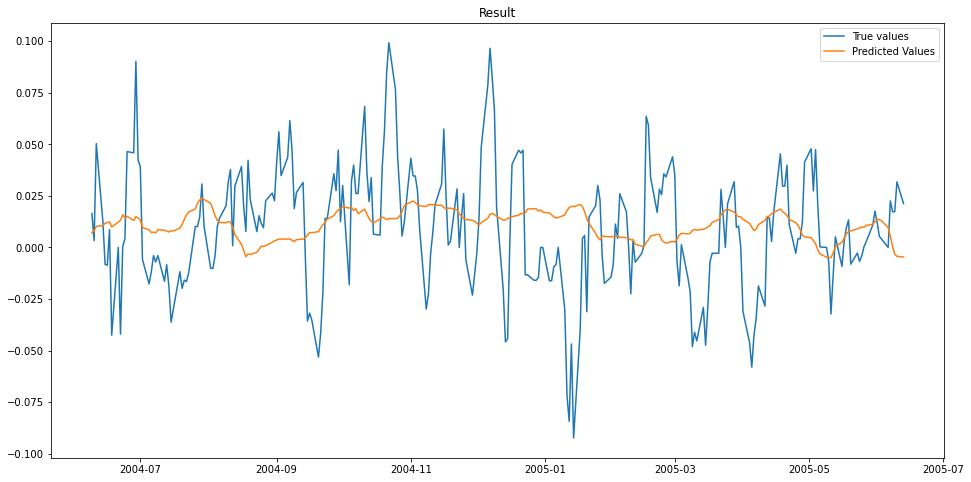


MSE: 0.0009662581007170045

Iteration No: 3 ended. Evaluation done at random point.
Time taken: 9.5849
Function value obtained: 0.0010
Current minimum: 0.0009
Iteration No: 4 started. Evaluating function at random point.

learning rate: 0.00012966511753760403
num_input_nodes: 186
dropout: 0.2346381772539376
sequence_length : 100
batch_size: 248



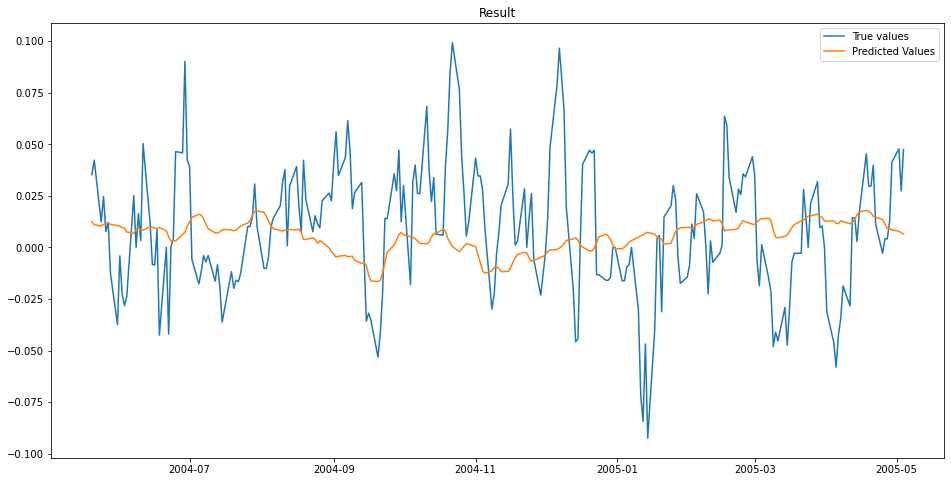


MSE: 0.00108577309577844

Iteration No: 4 ended. Evaluation done at random point.
Time taken: 16.0143
Function value obtained: 0.0011
Current minimum: 0.0009
Iteration No: 5 started. Evaluating function at random point.

learning rate: 0.0017177621112338384
num_input_nodes: 159
dropout: 0.001766576304929352
sequence_length : 102
batch_size: 132



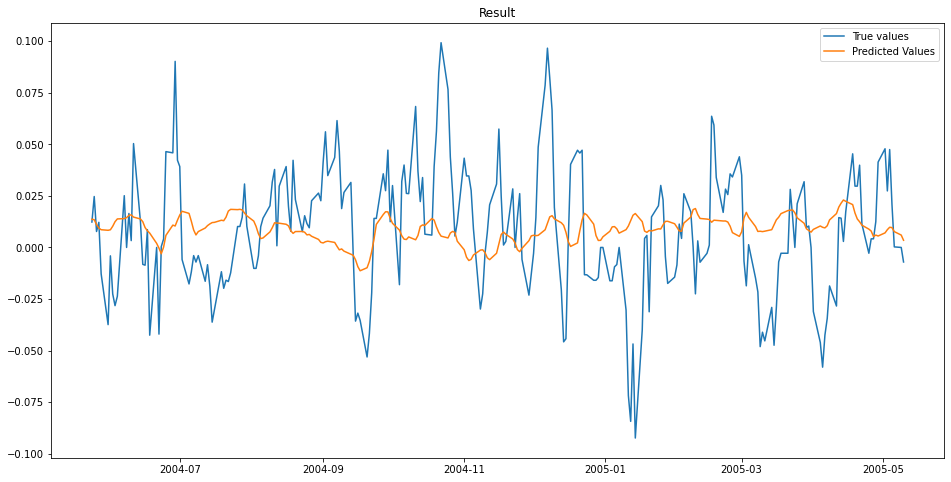


MSE: 0.0010160385518312514

Iteration No: 5 ended. Evaluation done at random point.
Time taken: 14.0057
Function value obtained: 0.0010
Current minimum: 0.0009
Iteration No: 6 started. Evaluating function at random point.

learning rate: 0.0006305535040199287
num_input_nodes: 17
dropout: 0.24343887971036485
sequence_length : 123
batch_size: 24



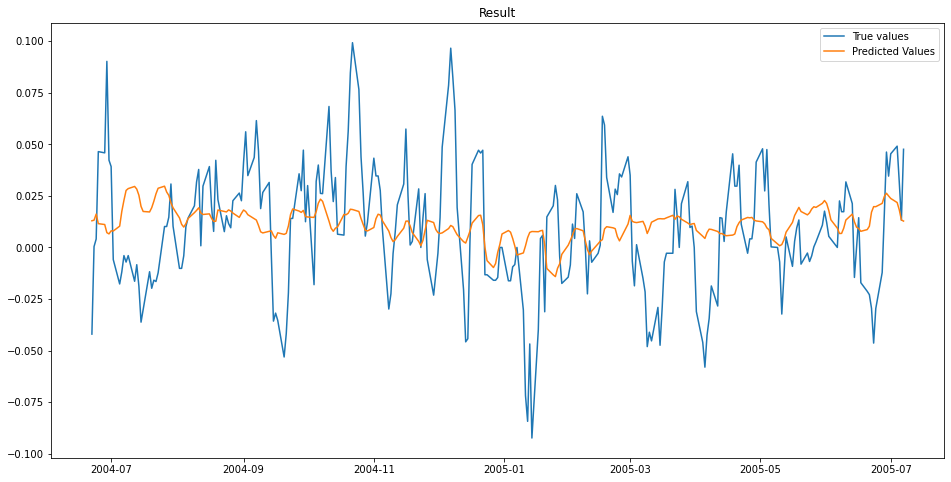


MSE: 0.0009071516347107858

Iteration No: 6 ended. Evaluation done at random point.
Time taken: 19.0609
Function value obtained: 0.0009
Current minimum: 0.0009
Iteration No: 7 started. Evaluating function at random point.

learning rate: 0.0017249321573178998
num_input_nodes: 101
dropout: 0.2458077214516971
sequence_length : 147
batch_size: 215



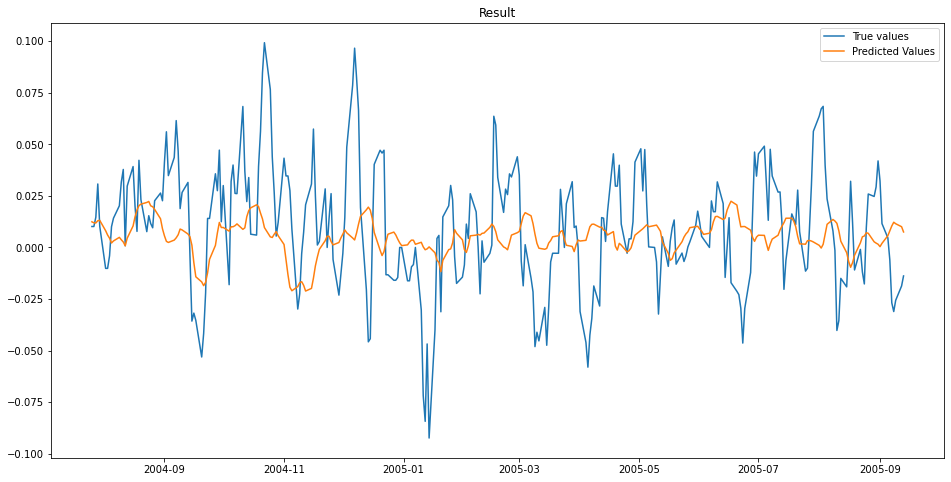


MSE: 0.0009391174656331371

Iteration No: 7 ended. Evaluation done at random point.
Time taken: 16.8195
Function value obtained: 0.0009
Current minimum: 0.0009
Iteration No: 8 started. Evaluating function at random point.

learning rate: 0.0022941144328643983
num_input_nodes: 118
dropout: 0.003316240289966633
sequence_length : 194
batch_size: 141



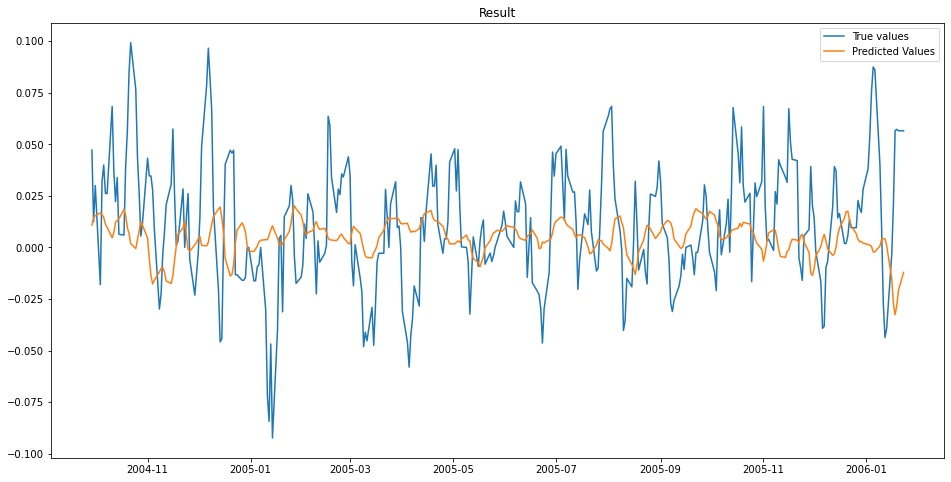


MSE: 0.0010732845557738042

Iteration No: 8 ended. Evaluation done at random point.
Time taken: 19.5976
Function value obtained: 0.0011
Current minimum: 0.0009
Iteration No: 9 started. Evaluating function at random point.

learning rate: 0.0005899741796710488
num_input_nodes: 9
dropout: 0.05772345640553726
sequence_length : 124
batch_size: 171



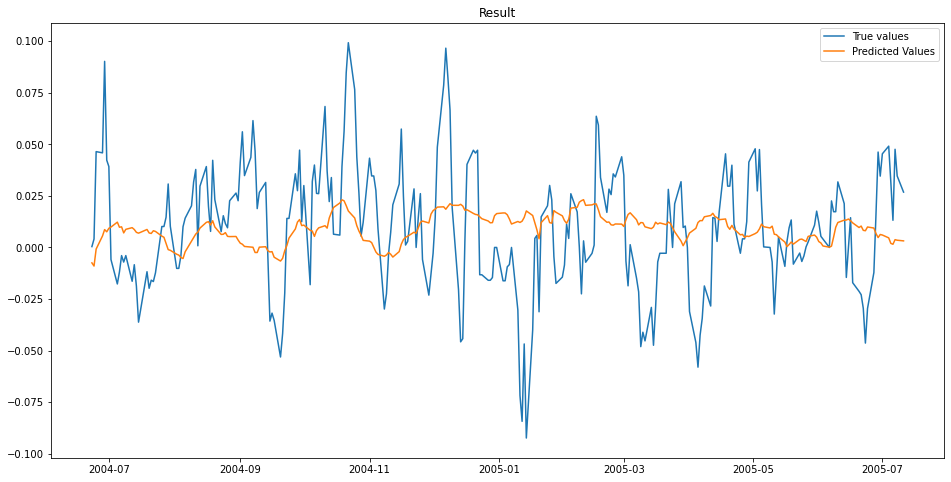


MSE: 0.0009523437914791523

Iteration No: 9 ended. Evaluation done at random point.
Time taken: 20.5691
Function value obtained: 0.0010
Current minimum: 0.0009
Iteration No: 10 started. Evaluating function at random point.

learning rate: 0.0016595613641357258
num_input_nodes: 214
dropout: 0.04334116337694303
sequence_length : 139
batch_size: 46



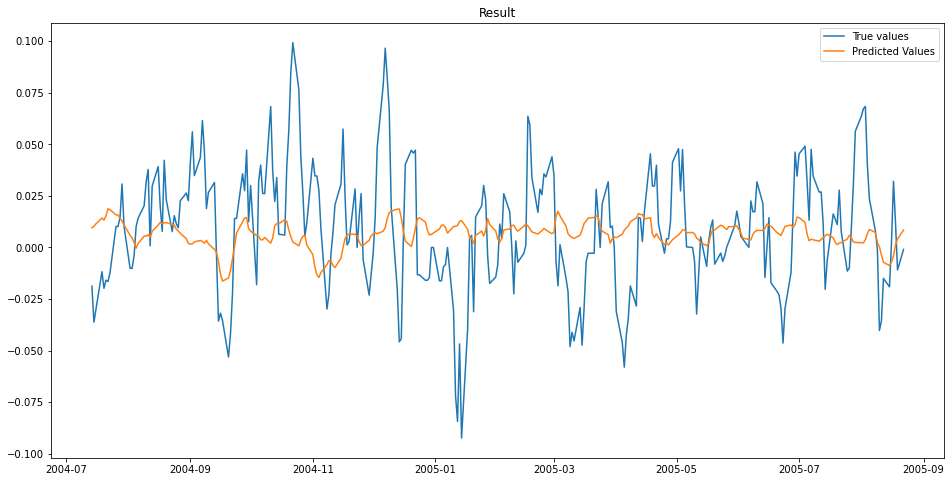


MSE: 0.0009575259837900752

Iteration No: 10 ended. Evaluation done at random point.
Time taken: 27.1832
Function value obtained: 0.0010
Current minimum: 0.0009
Iteration No: 11 started. Evaluating function at random point.

learning rate: 0.0032413268041956303
num_input_nodes: 112
dropout: 0.05198541571704722
sequence_length : 157
batch_size: 9



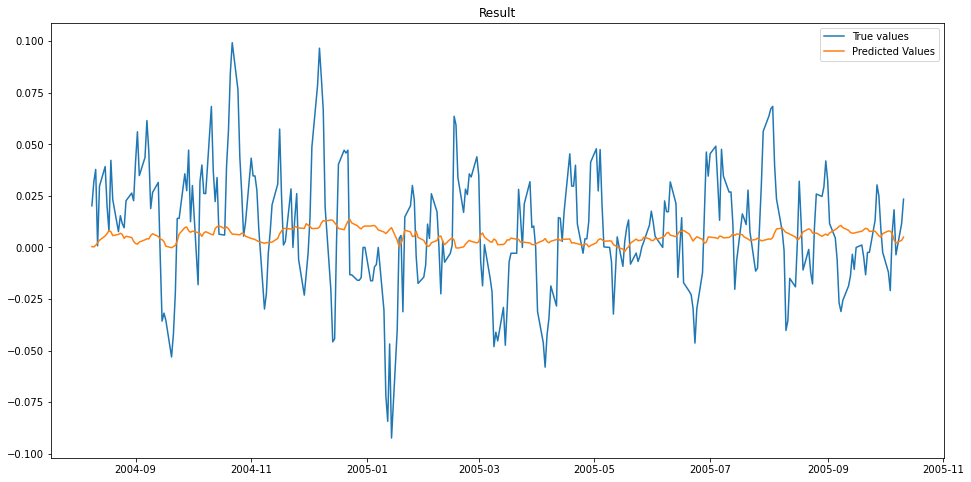


MSE: 0.0008877293143863694

Iteration No: 11 ended. Evaluation done at random point.
Time taken: 47.9266
Function value obtained: 0.0009
Current minimum: 0.0009
Iteration No: 12 started. Evaluating function at random point.

learning rate: 0.004836927180682221
num_input_nodes: 227
dropout: 0.18507824608274567
sequence_length : 163
batch_size: 20



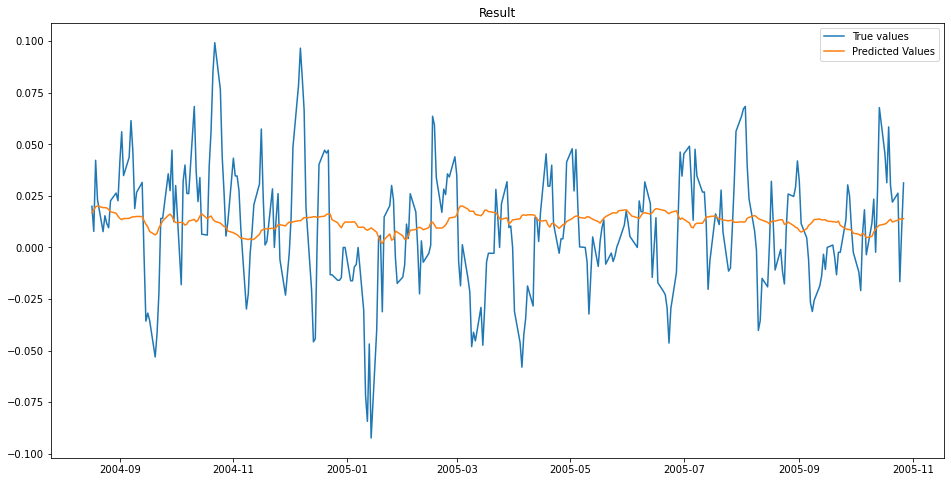


MSE: 0.0008915937603421383

Iteration No: 12 ended. Evaluation done at random point.
Time taken: 62.1268
Function value obtained: 0.0009
Current minimum: 0.0009
Iteration No: 13 started. Searching for the next optimal point.

learning rate: 0.0006230447676178661
num_input_nodes: 253
dropout: 0.005802893896486778
sequence_length : 137
batch_size: 84



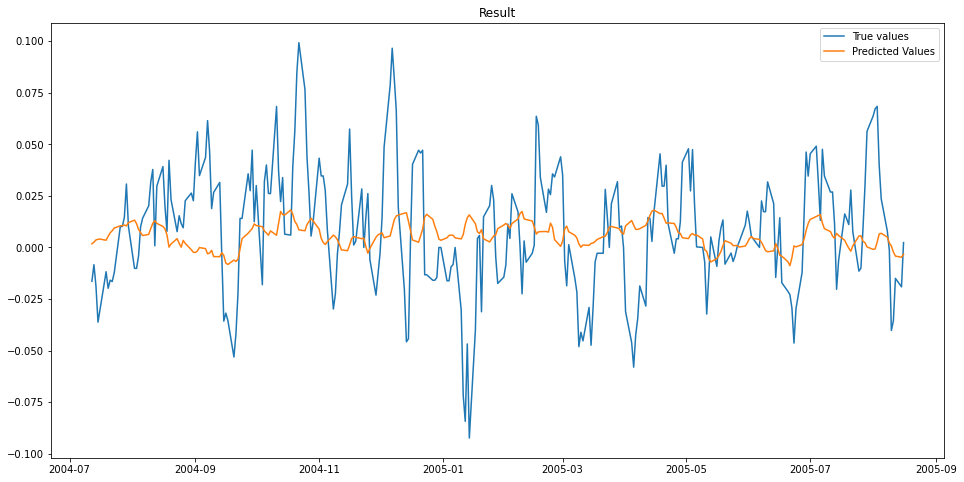


MSE: 0.0009211185742345305

Iteration No: 13 ended. Search finished for the next optimal point.
Time taken: 20.5726
Function value obtained: 0.0009
Current minimum: 0.0009
Iteration No: 14 started. Searching for the next optimal point.

learning rate: 0.0001588386428546095
num_input_nodes: 248
dropout: 0.24835422618565692
sequence_length : 171
batch_size: 197



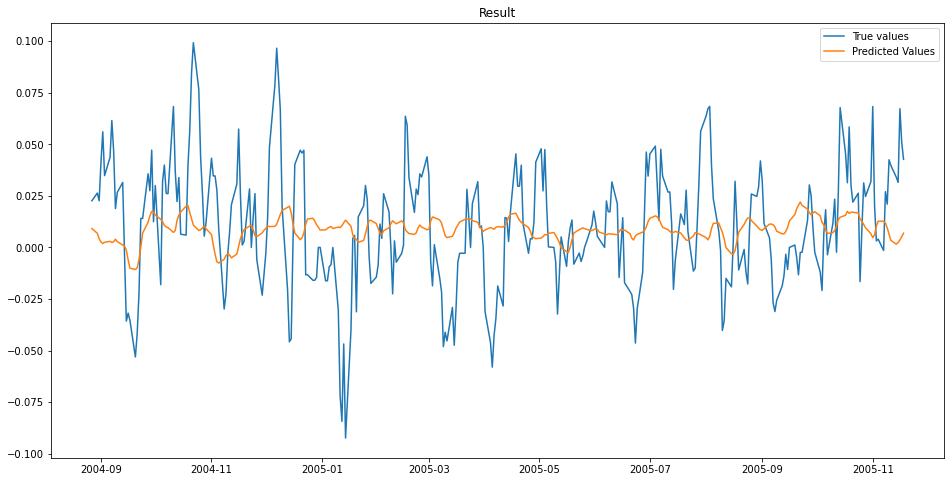


MSE: 0.0009032752858503595

Iteration No: 14 ended. Search finished for the next optimal point.
Time taken: 24.0265
Function value obtained: 0.0009
Current minimum: 0.0009
Iteration No: 15 started. Searching for the next optimal point.

learning rate: 0.00010993676976866407
num_input_nodes: 98
dropout: 0.19810399992331712
sequence_length : 151
batch_size: 140



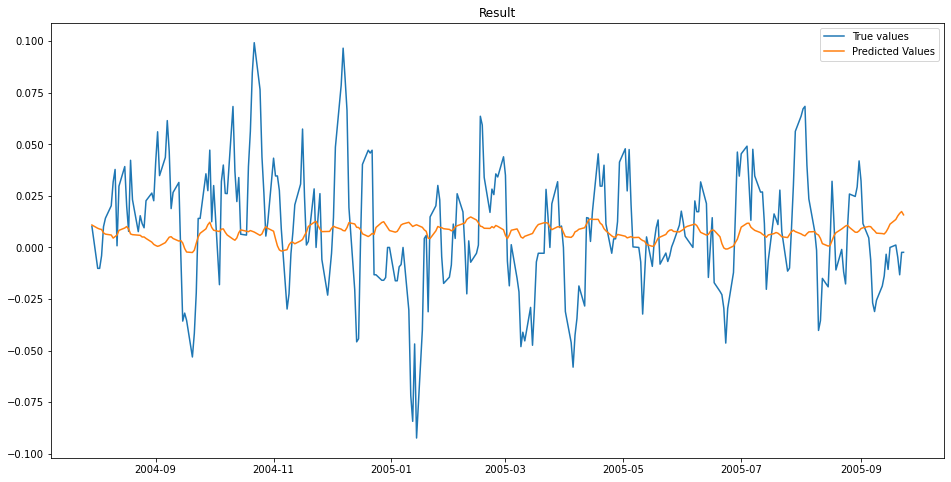


MSE: 0.0008808281893210448

Iteration No: 15 ended. Search finished for the next optimal point.
Time taken: 19.8362
Function value obtained: 0.0009
Current minimum: 0.0009
Iteration No: 16 started. Searching for the next optimal point.

learning rate: 0.0001040887456555644
num_input_nodes: 228
dropout: 0.1383620356395441
sequence_length : 150
batch_size: 41



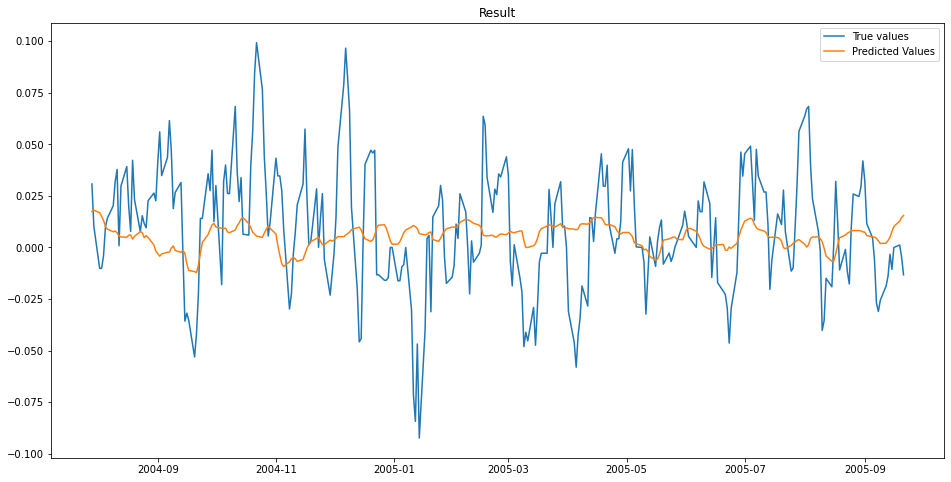


MSE: 0.0008966064958560064

Iteration No: 16 ended. Search finished for the next optimal point.
Time taken: 23.3583
Function value obtained: 0.0009
Current minimum: 0.0009
Iteration No: 17 started. Searching for the next optimal point.

learning rate: 0.0009985535328897455
num_input_nodes: 75
dropout: 0.0958094665983181
sequence_length : 141
batch_size: 1



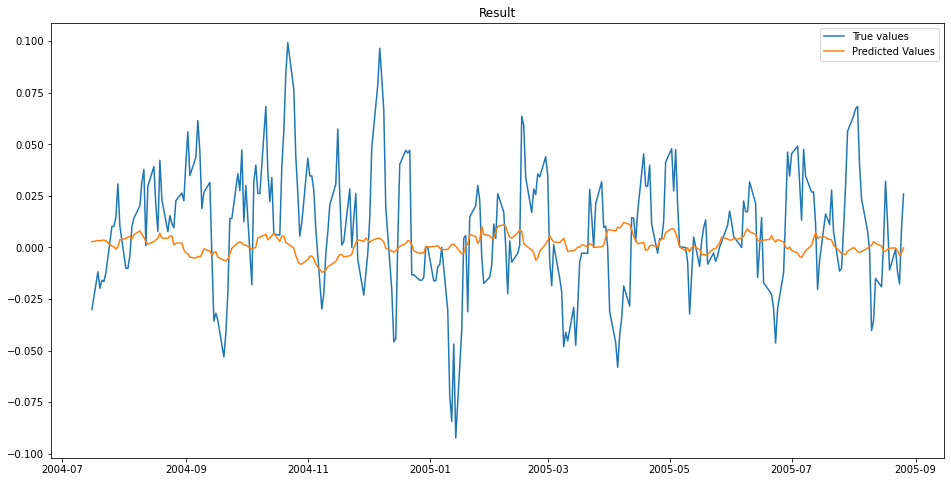


MSE: 0.000974571175083898

Iteration No: 17 ended. Search finished for the next optimal point.
Time taken: 260.2452
Function value obtained: 0.0010
Current minimum: 0.0009
Iteration No: 18 started. Searching for the next optimal point.

learning rate: 0.00046529422467662463
num_input_nodes: 201
dropout: 0.0
sequence_length : 167
batch_size: 67



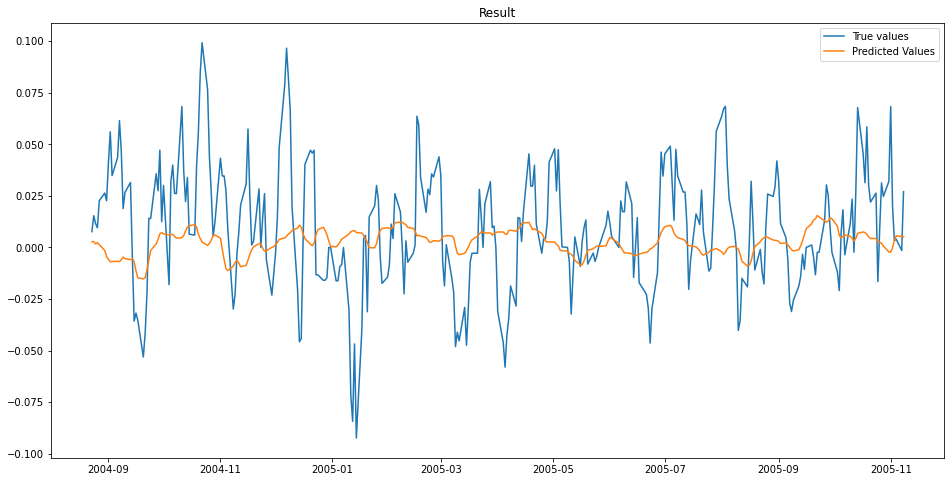


MSE: 0.0009358271206687373

Iteration No: 18 ended. Search finished for the next optimal point.
Time taken: 25.1629
Function value obtained: 0.0009
Current minimum: 0.0009
Iteration No: 19 started. Searching for the next optimal point.

learning rate: 0.001260125944408241
num_input_nodes: 202
dropout: 0.18767515931581125
sequence_length : 149
batch_size: 239



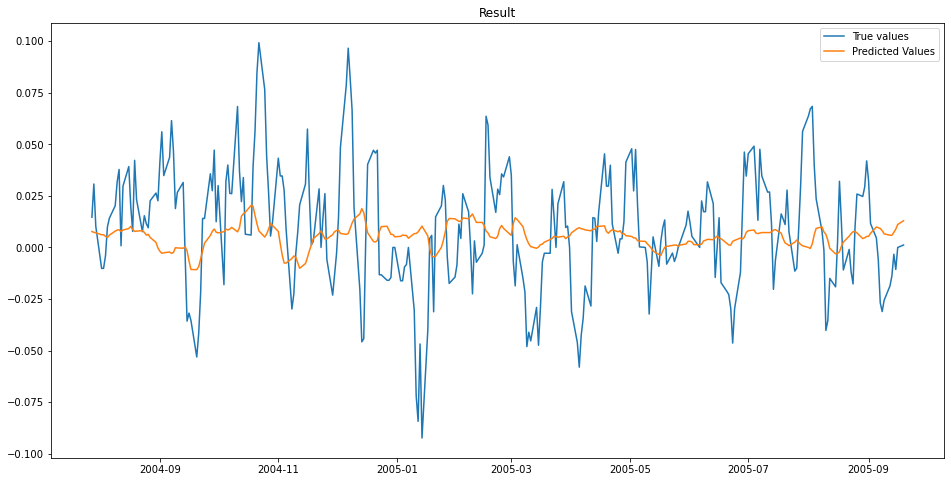


MSE: 0.0009135069313044086

Iteration No: 19 ended. Search finished for the next optimal point.
Time taken: 16.9510
Function value obtained: 0.0009
Current minimum: 0.0009
Iteration No: 20 started. Searching for the next optimal point.

learning rate: 0.00018981097088677988
num_input_nodes: 89
dropout: 0.19130246590078676
sequence_length : 138
batch_size: 89



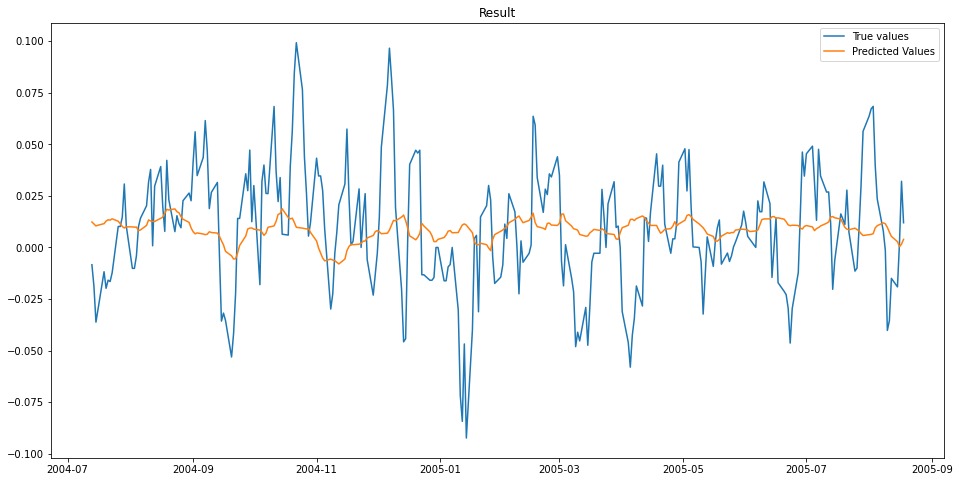


MSE: 0.0009215118225066046

Iteration No: 20 ended. Search finished for the next optimal point.
Time taken: 20.6424
Function value obtained: 0.0009
Current minimum: 0.0009
Iteration No: 21 started. Searching for the next optimal point.

learning rate: 0.0030916251770585048
num_input_nodes: 217
dropout: 0.2466891970472114
sequence_length : 132
batch_size: 179



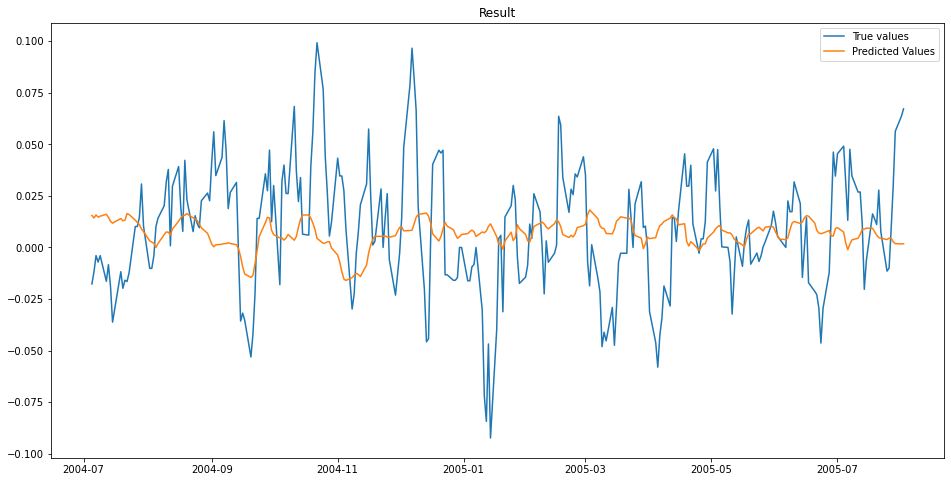


MSE: 0.0009609358435857397

Iteration No: 21 ended. Search finished for the next optimal point.
Time taken: 17.2307
Function value obtained: 0.0010
Current minimum: 0.0009
Iteration No: 22 started. Searching for the next optimal point.

learning rate: 0.0006405549304857785
num_input_nodes: 141
dropout: 0.15625659714923773
sequence_length : 187
batch_size: 30



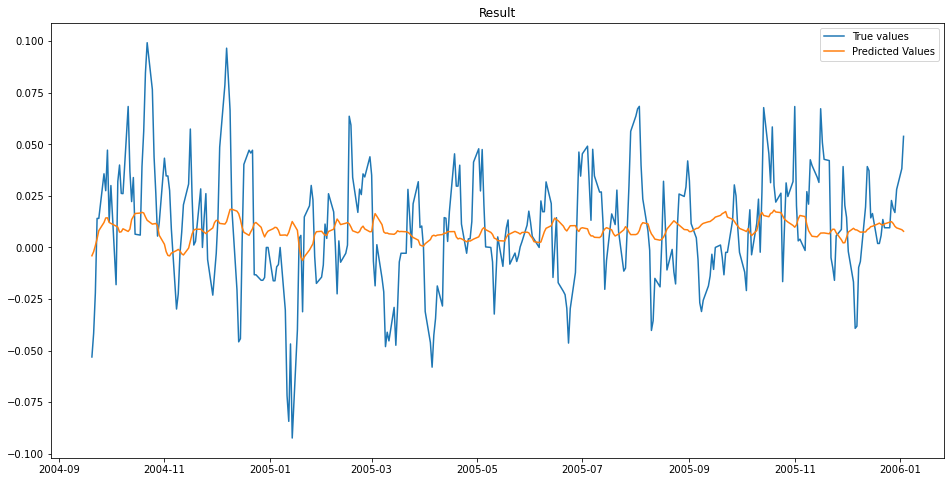


MSE: 0.0008401375505398384

Iteration No: 22 ended. Search finished for the next optimal point.
Time taken: 37.1372
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 23 started. Searching for the next optimal point.

learning rate: 0.0008702141964891654
num_input_nodes: 114
dropout: 0.21218122653025484
sequence_length : 123
batch_size: 245



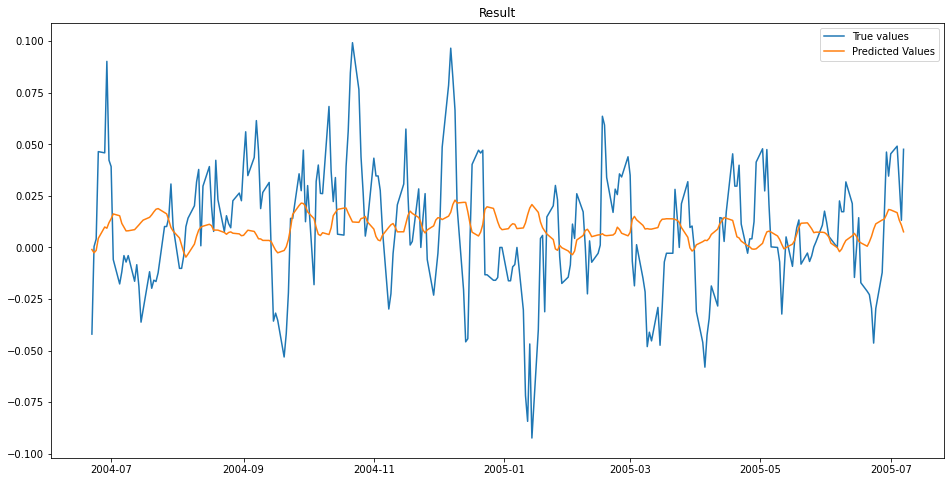


MSE: 0.0009421013293201947

Iteration No: 23 ended. Search finished for the next optimal point.
Time taken: 12.9856
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 24 started. Searching for the next optimal point.

learning rate: 0.008054555633745636
num_input_nodes: 34
dropout: 0.1856635354627786
sequence_length : 170
batch_size: 135



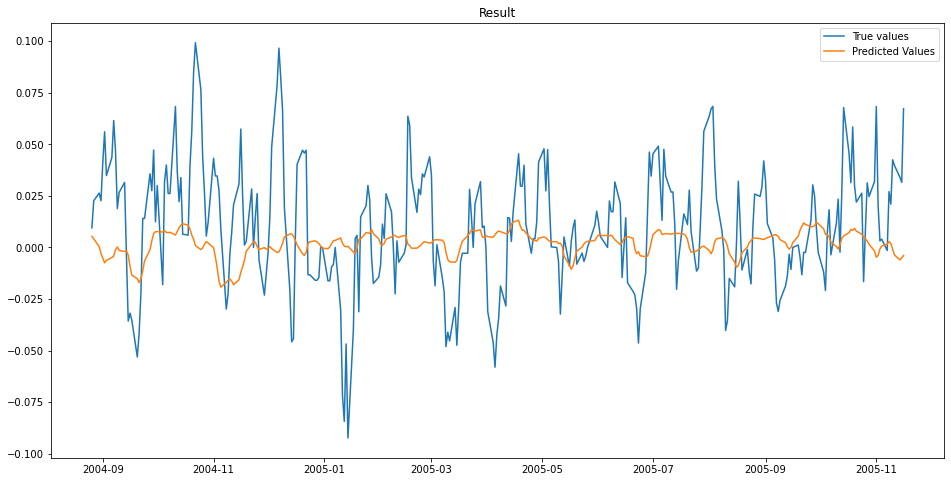


MSE: 0.0009651083324094314

Iteration No: 24 ended. Search finished for the next optimal point.
Time taken: 12.2570
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 25 started. Searching for the next optimal point.

learning rate: 0.0002858844098343165
num_input_nodes: 124
dropout: 0.19871927528155914
sequence_length : 112
batch_size: 17



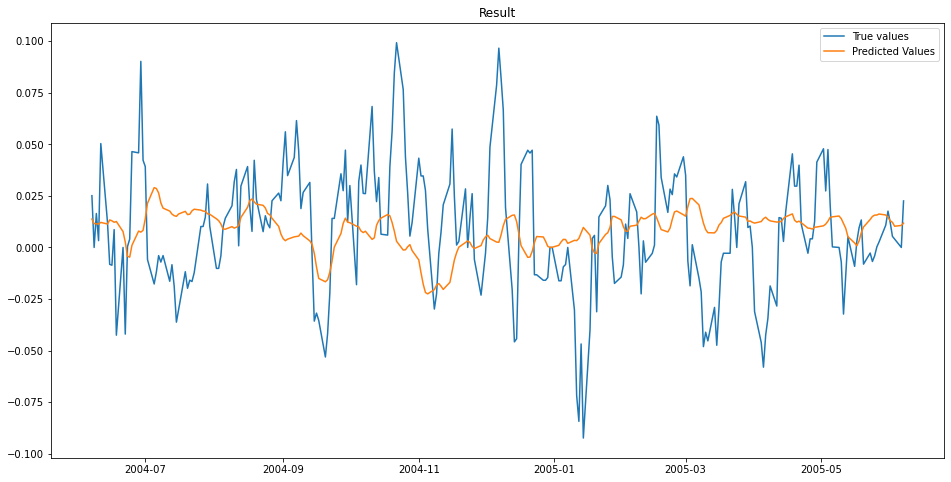


MSE: 0.0010277678395012818

Iteration No: 25 ended. Search finished for the next optimal point.
Time taken: 28.3583
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 26 started. Searching for the next optimal point.

learning rate: 0.00029093815397366615
num_input_nodes: 126
dropout: 0.10884438044266982
sequence_length : 184
batch_size: 8



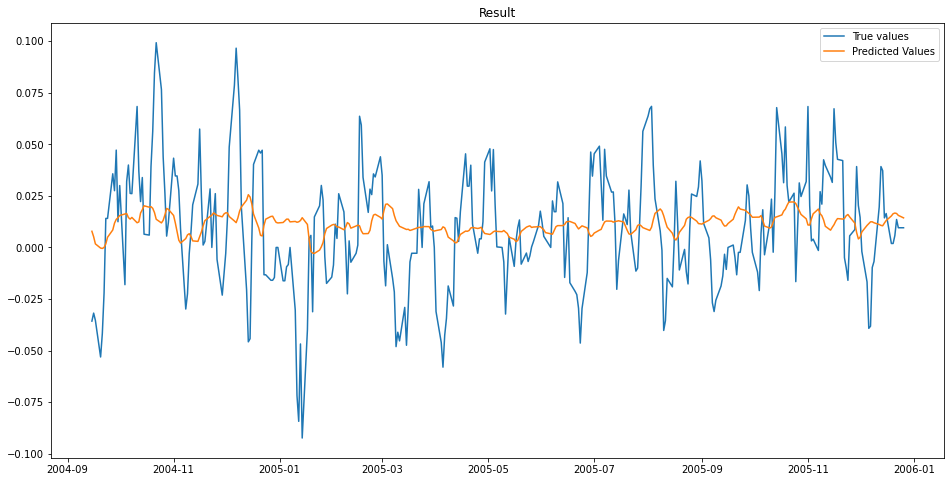


MSE: 0.0008775398732757937

Iteration No: 26 ended. Search finished for the next optimal point.
Time taken: 56.1248
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 27 started. Searching for the next optimal point.

learning rate: 0.00391989751341379
num_input_nodes: 67
dropout: 0.22209883733973426
sequence_length : 161
batch_size: 144



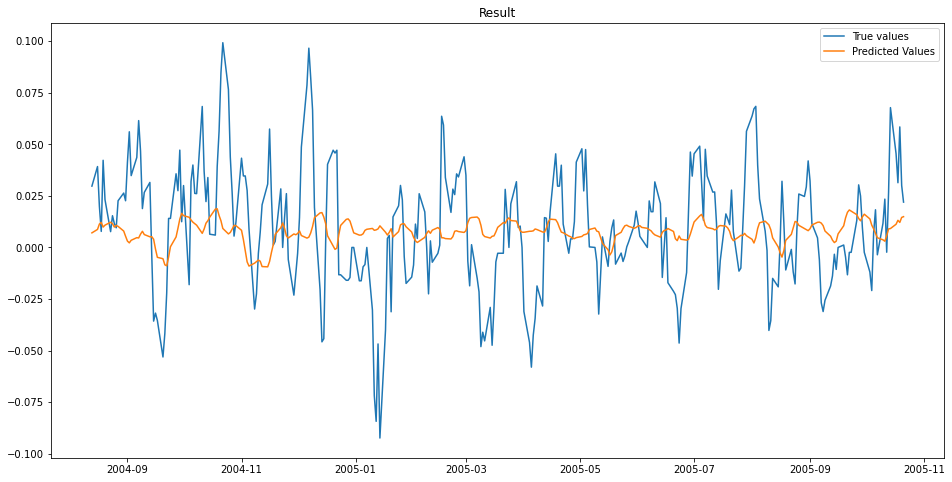


MSE: 0.0009050382853940835

Iteration No: 27 ended. Search finished for the next optimal point.
Time taken: 13.7413
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 28 started. Searching for the next optimal point.

learning rate: 0.0022506529857244336
num_input_nodes: 161
dropout: 0.08522162464234627
sequence_length : 155
batch_size: 198



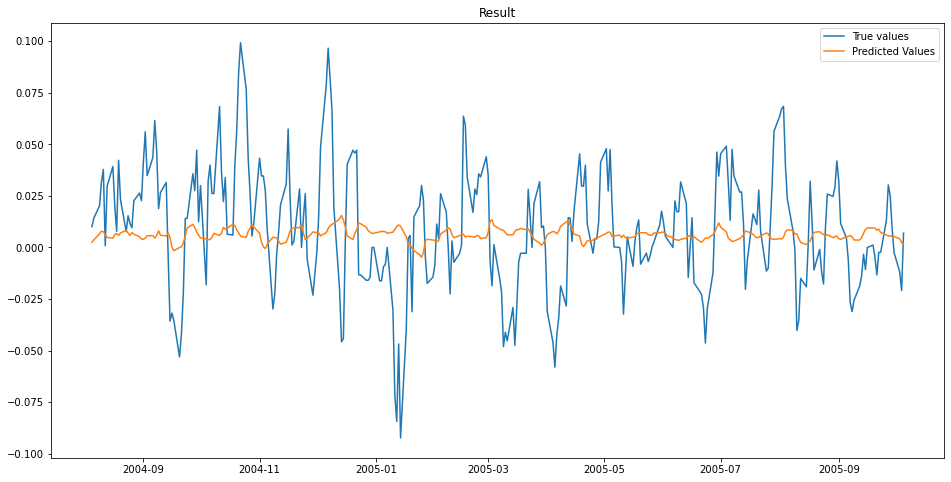


MSE: 0.0009034771100965598

Iteration No: 28 ended. Search finished for the next optimal point.
Time taken: 16.0009
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 29 started. Searching for the next optimal point.

learning rate: 0.00043407796537720076
num_input_nodes: 207
dropout: 0.05111844448881574
sequence_length : 187
batch_size: 195



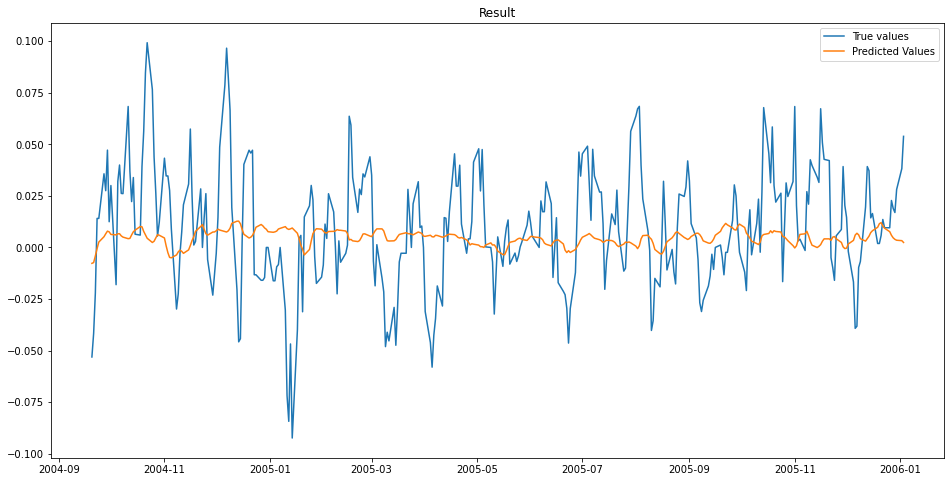


MSE: 0.0008953334715705585

Iteration No: 29 ended. Search finished for the next optimal point.
Time taken: 20.2902
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 30 started. Searching for the next optimal point.

learning rate: 0.0020071857054210717
num_input_nodes: 53
dropout: 0.15903945320548288
sequence_length : 110
batch_size: 151



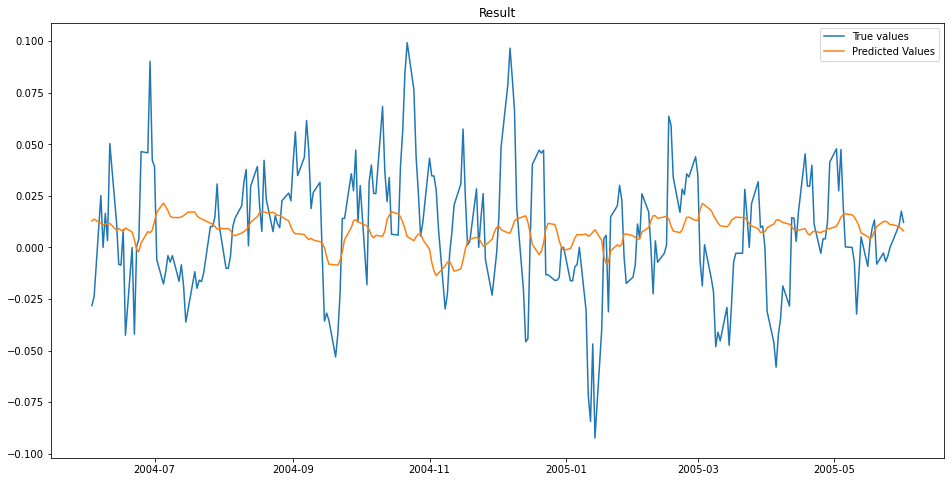


MSE: 0.0010082756080479539

Iteration No: 30 ended. Search finished for the next optimal point.
Time taken: 11.4759
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 31 started. Searching for the next optimal point.

learning rate: 0.0017560590100163395
num_input_nodes: 197
dropout: 0.1088747643186341
sequence_length : 121
batch_size: 65



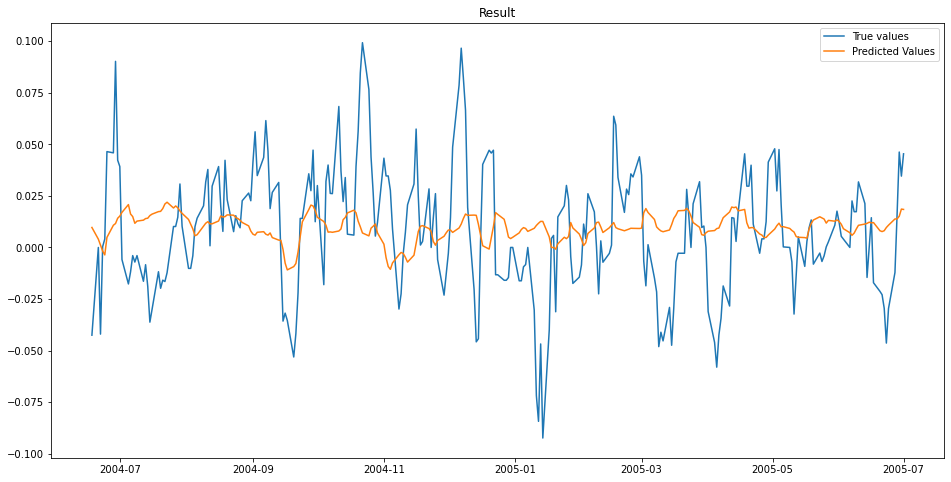


MSE: 0.0009598210429187642

Iteration No: 31 ended. Search finished for the next optimal point.
Time taken: 22.1951
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 32 started. Searching for the next optimal point.

learning rate: 0.0008633902007401385
num_input_nodes: 127
dropout: 0.008028454523932834
sequence_length : 176
batch_size: 126



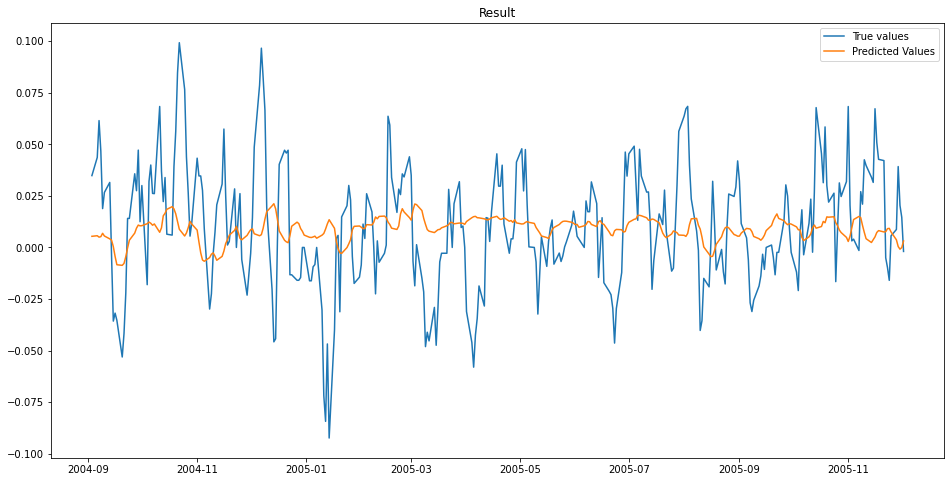


MSE: 0.0009015837984504291

Iteration No: 32 ended. Search finished for the next optimal point.
Time taken: 17.0587
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 33 started. Searching for the next optimal point.

learning rate: 0.0003125732810502738
num_input_nodes: 52
dropout: 0.11887285405944947
sequence_length : 158
batch_size: 179



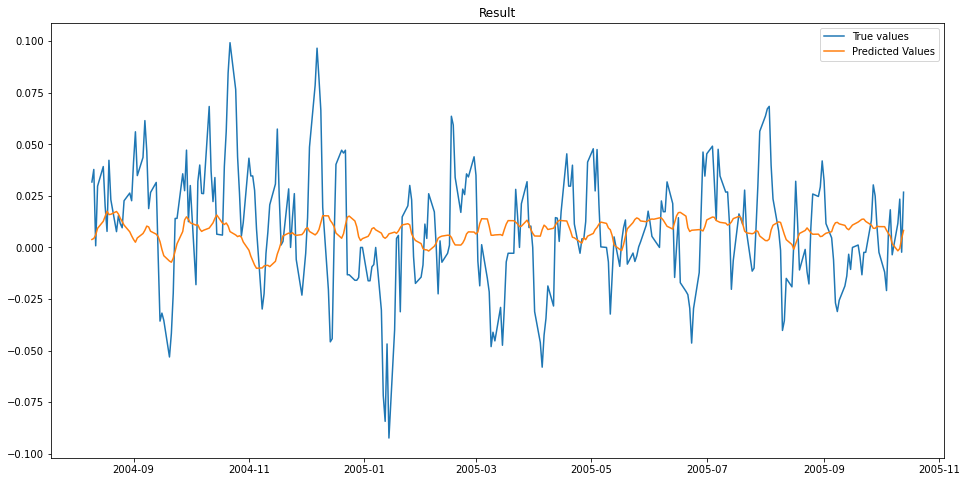


MSE: 0.000883235958023576

Iteration No: 33 ended. Search finished for the next optimal point.
Time taken: 15.9967
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 34 started. Searching for the next optimal point.

learning rate: 0.00022184183289896374
num_input_nodes: 96
dropout: 0.011921636836763397
sequence_length : 129
batch_size: 205



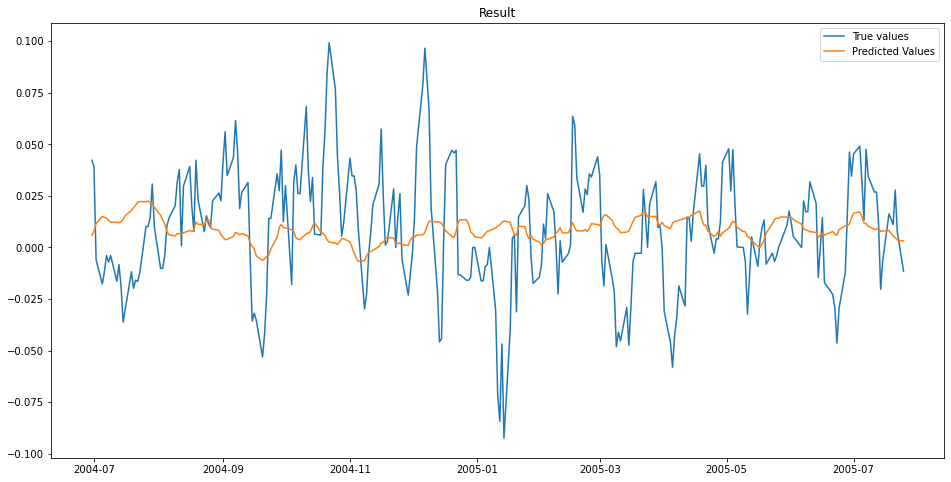


MSE: 0.0009227374613946258

Iteration No: 34 ended. Search finished for the next optimal point.
Time taken: 13.7038
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 35 started. Searching for the next optimal point.

learning rate: 0.01
num_input_nodes: 240
dropout: 0.25
sequence_length : 185
batch_size: 113



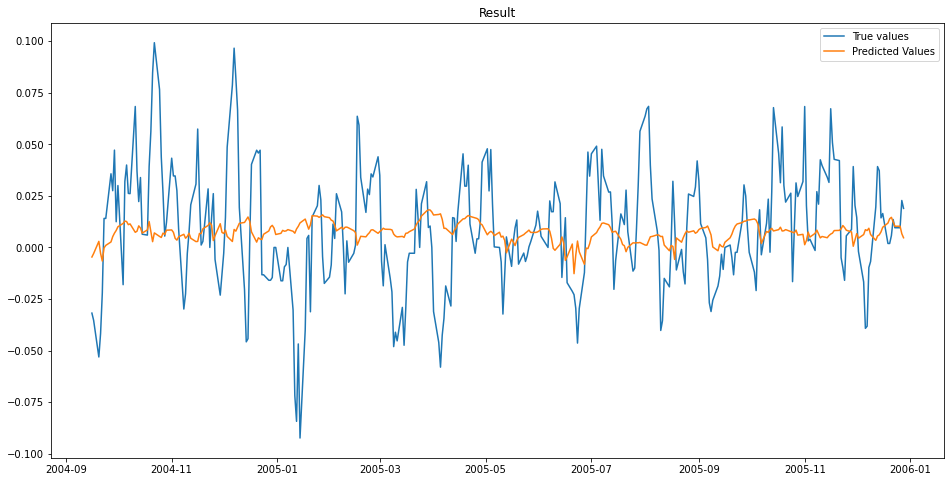


MSE: 0.0008833517238757147

Iteration No: 35 ended. Search finished for the next optimal point.
Time taken: 17.3666
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 36 started. Searching for the next optimal point.

learning rate: 0.0001
num_input_nodes: 52
dropout: 0.25
sequence_length : 187
batch_size: 23



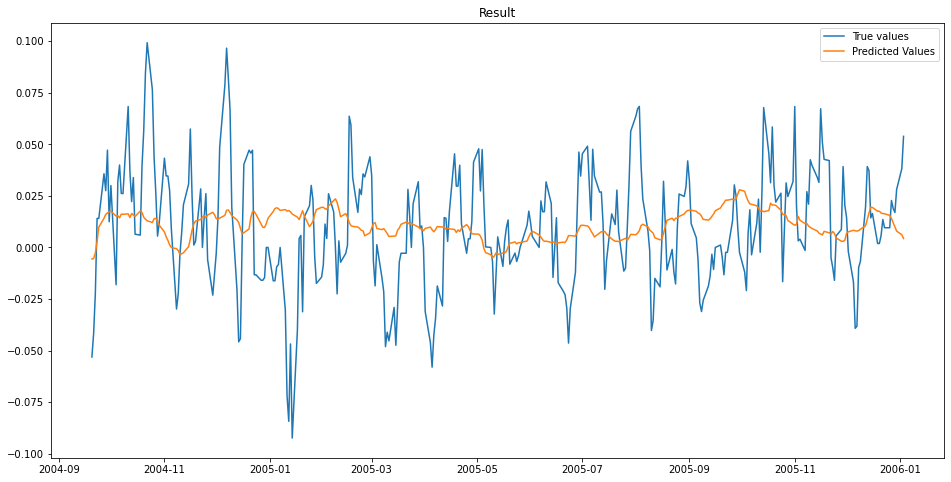


MSE: 0.0008603442574037105

Iteration No: 36 ended. Search finished for the next optimal point.
Time taken: 22.3957
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 37 started. Searching for the next optimal point.

learning rate: 0.0001
num_input_nodes: 70
dropout: 0.25
sequence_length : 179
batch_size: 23



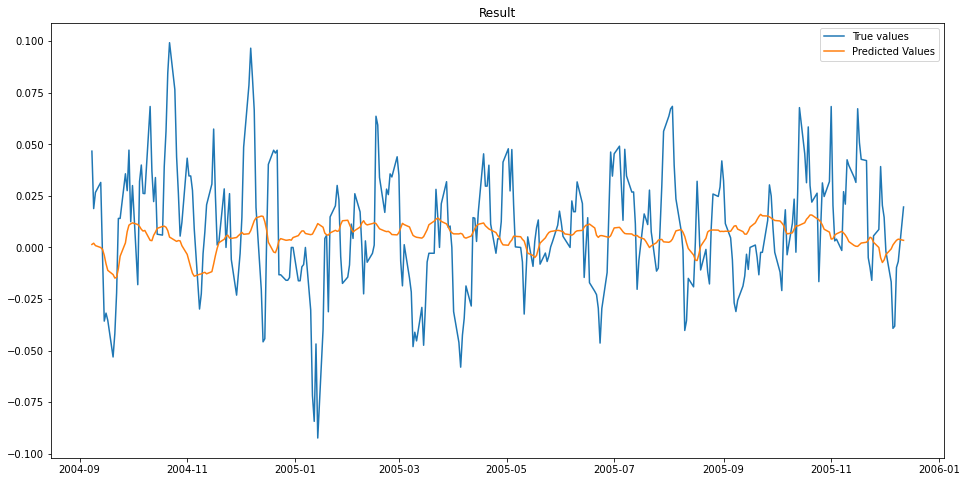


MSE: 0.0009130272105869357

Iteration No: 37 ended. Search finished for the next optimal point.
Time taken: 51.9134
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 38 started. Searching for the next optimal point.

learning rate: 0.001385168775294796
num_input_nodes: 149
dropout: 0.04594948359045937
sequence_length : 114
batch_size: 57



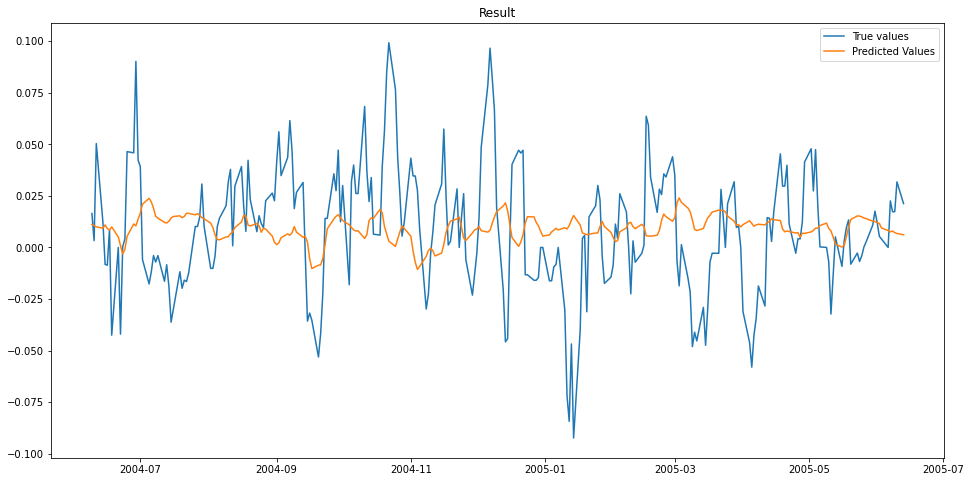


MSE: 0.0009977986537772333

Iteration No: 38 ended. Search finished for the next optimal point.
Time taken: 19.4214
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 39 started. Searching for the next optimal point.

learning rate: 0.008510984339216363
num_input_nodes: 6
dropout: 0.05192338510125548
sequence_length : 118
batch_size: 2



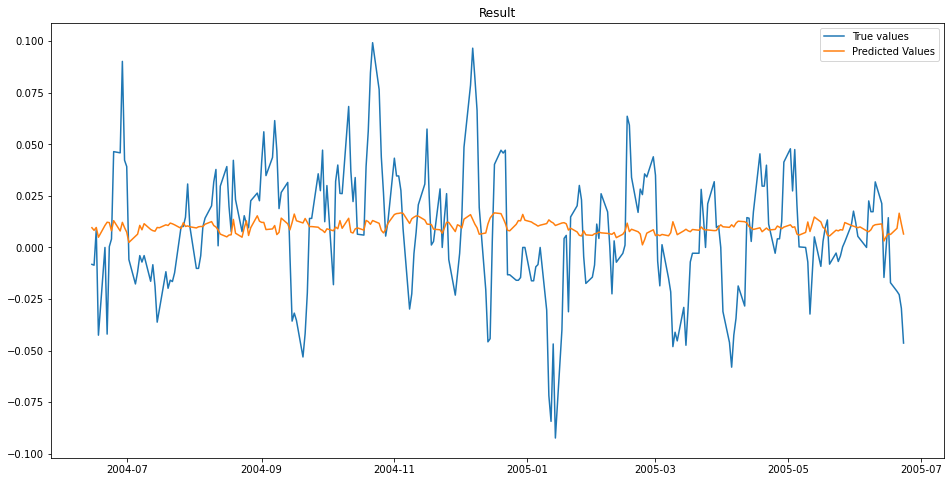


MSE: 0.0009227006159920311

Iteration No: 39 ended. Search finished for the next optimal point.
Time taken: 101.0458
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 40 started. Searching for the next optimal point.

learning rate: 0.00025023919664219615
num_input_nodes: 244
dropout: 0.1194401150232195
sequence_length : 114
batch_size: 166



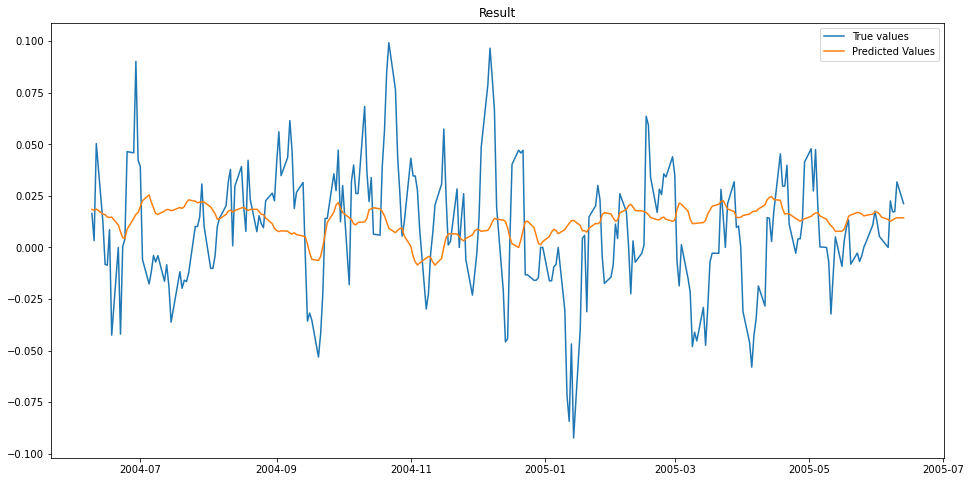


MSE: 0.0009784212397138236

Iteration No: 40 ended. Search finished for the next optimal point.
Time taken: 19.5498
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 41 started. Searching for the next optimal point.

learning rate: 0.0006916911497906814
num_input_nodes: 142
dropout: 0.18595234380023104
sequence_length : 166
batch_size: 109



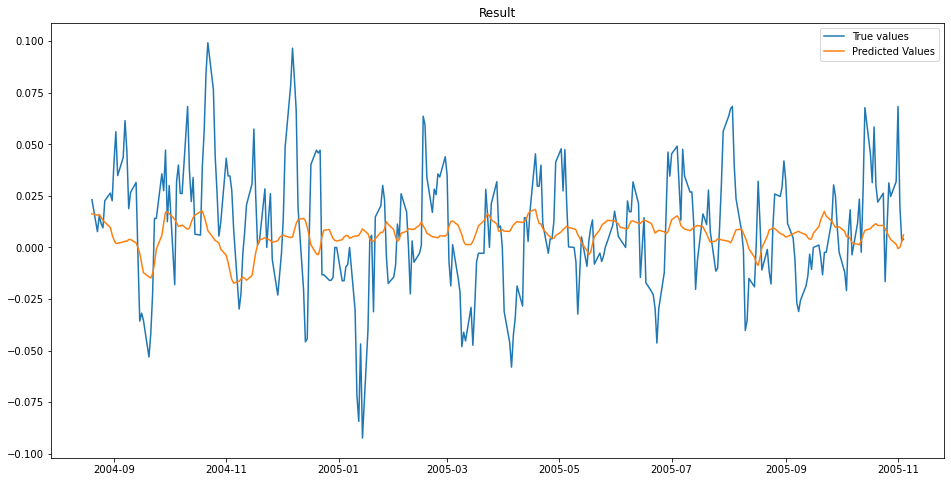


MSE: 0.0008994605853484441

Iteration No: 41 ended. Search finished for the next optimal point.
Time taken: 23.3657
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 42 started. Searching for the next optimal point.

learning rate: 0.006257393327206118
num_input_nodes: 86
dropout: 0.12898899378067608
sequence_length : 178
batch_size: 185



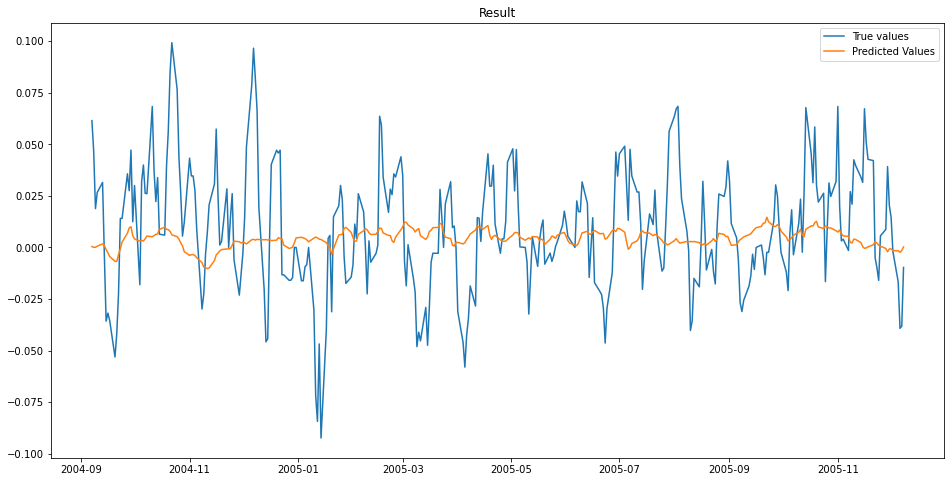


MSE: 0.0008998230802265585

Iteration No: 42 ended. Search finished for the next optimal point.
Time taken: 15.2809
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 43 started. Searching for the next optimal point.

learning rate: 0.01
num_input_nodes: 105
dropout: 0.0
sequence_length : 187
batch_size: 1



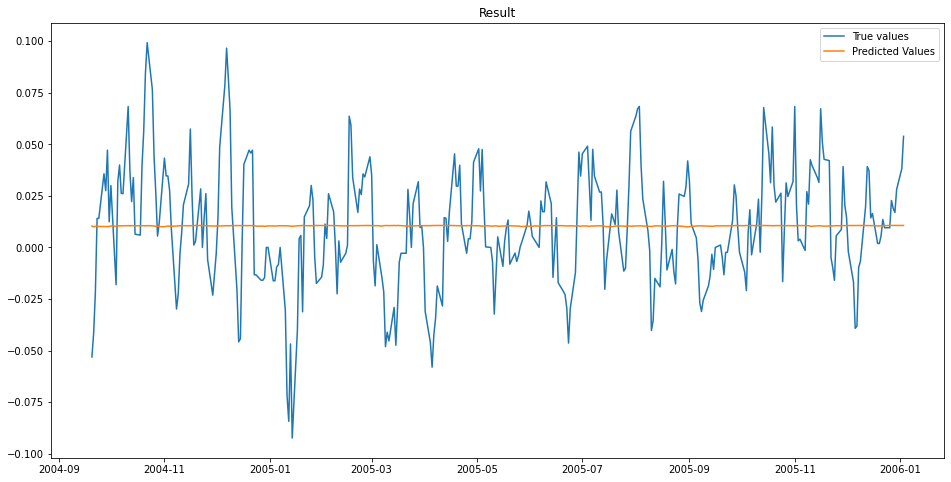


MSE: 0.000843172887325183

Iteration No: 43 ended. Search finished for the next optimal point.
Time taken: 303.0371
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 44 started. Searching for the next optimal point.

learning rate: 0.00015999394011370437
num_input_nodes: 181
dropout: 0.08604513919744848
sequence_length : 110
batch_size: 34



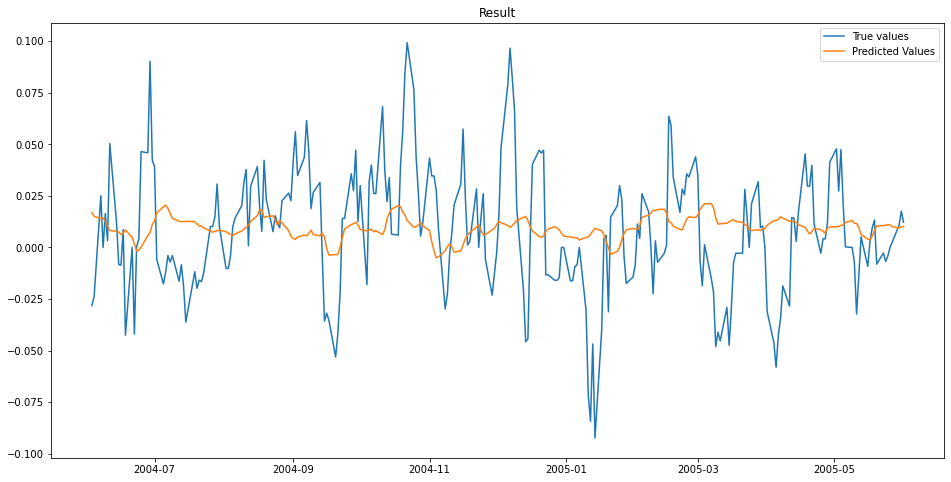


MSE: 0.0009687552116100749

Iteration No: 44 ended. Search finished for the next optimal point.
Time taken: 30.4675
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 45 started. Searching for the next optimal point.

learning rate: 0.002576050711952346
num_input_nodes: 217
dropout: 0.18008333534734158
sequence_length : 187
batch_size: 33



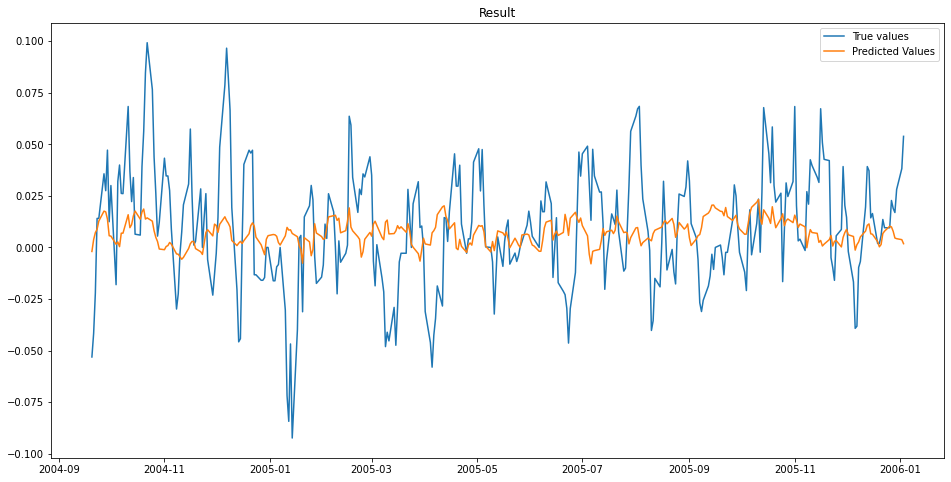


MSE: 0.0008427952018776118

Iteration No: 45 ended. Search finished for the next optimal point.
Time taken: 44.2288
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 46 started. Searching for the next optimal point.

learning rate: 0.0036879818841733195
num_input_nodes: 88
dropout: 0.24555595662566815
sequence_length : 165
batch_size: 41



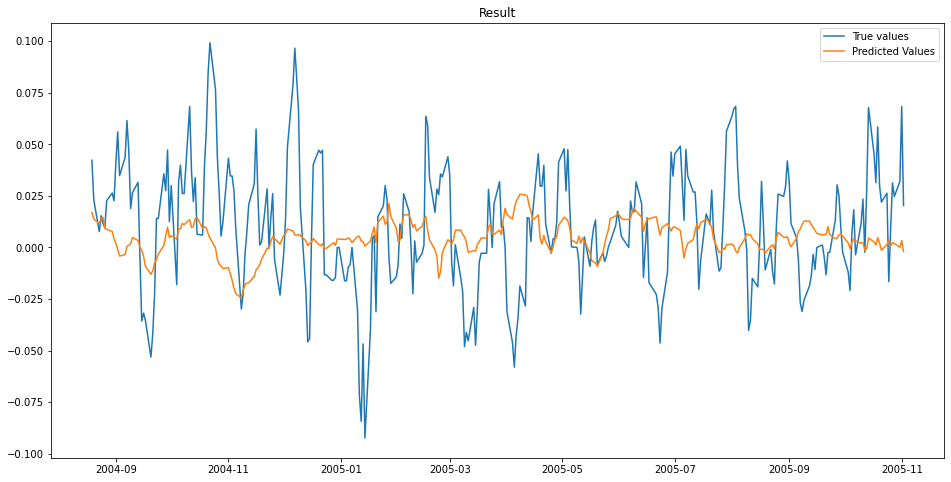


MSE: 0.0009740390827088799

Iteration No: 46 ended. Search finished for the next optimal point.
Time taken: 21.5302
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 47 started. Searching for the next optimal point.

learning rate: 0.00011635407776633327
num_input_nodes: 92
dropout: 0.19701404602314318
sequence_length : 157
batch_size: 26



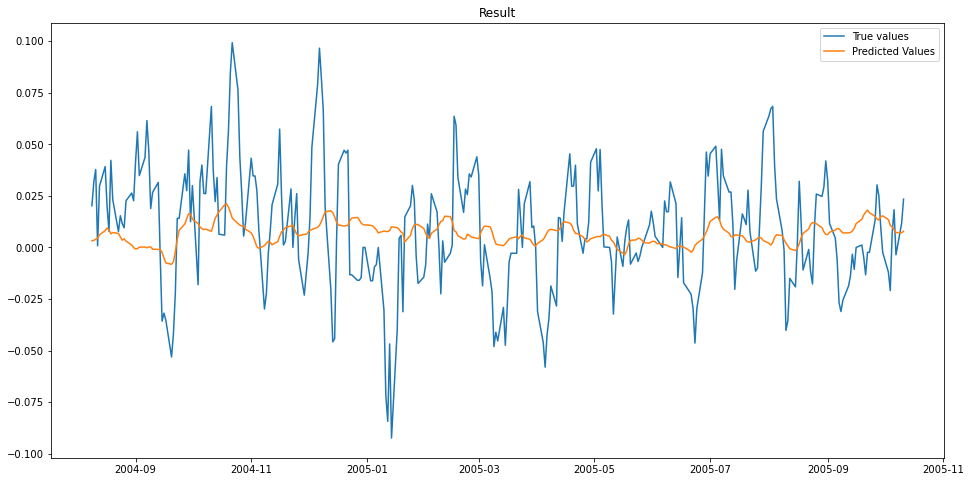


MSE: 0.0008512539631538123

Iteration No: 47 ended. Search finished for the next optimal point.
Time taken: 24.5808
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 48 started. Searching for the next optimal point.

learning rate: 0.00098393071892428
num_input_nodes: 216
dropout: 0.0919402180489166
sequence_length : 168
batch_size: 52



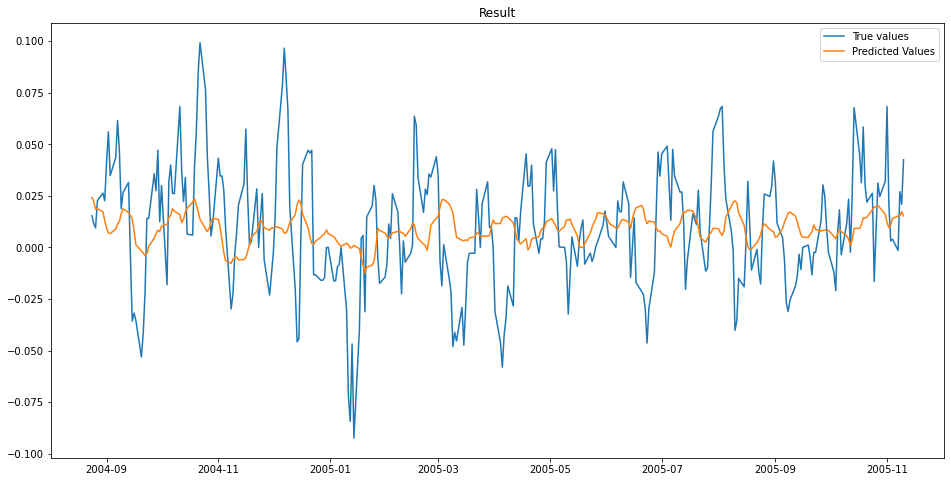


MSE: 0.0009023287725505978

Iteration No: 48 ended. Search finished for the next optimal point.
Time taken: 22.4795
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 49 started. Searching for the next optimal point.

learning rate: 0.01
num_input_nodes: 5
dropout: 0.06726127204285778
sequence_length : 186
batch_size: 1



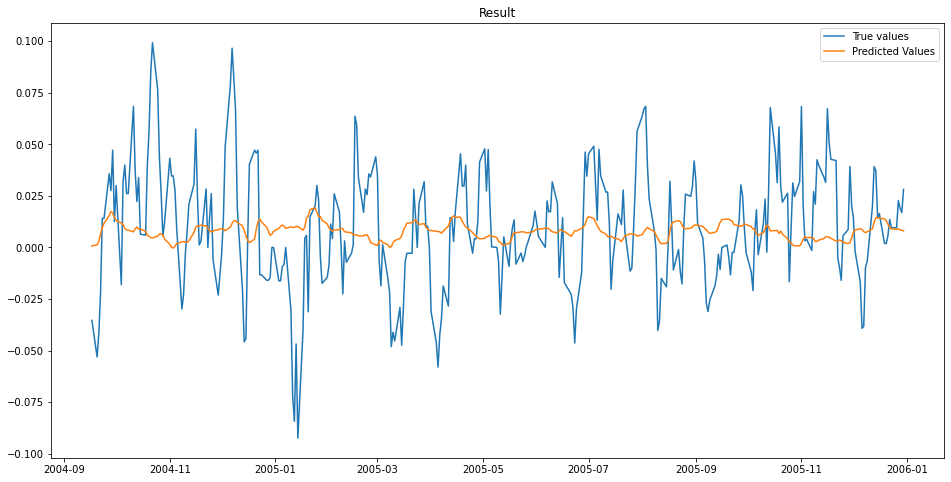


MSE: 0.0008483265955370993

Iteration No: 49 ended. Search finished for the next optimal point.
Time taken: 305.0461
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 50 started. Searching for the next optimal point.

learning rate: 0.0015196648522700794
num_input_nodes: 144
dropout: 0.12923914683506915
sequence_length : 107
batch_size: 181



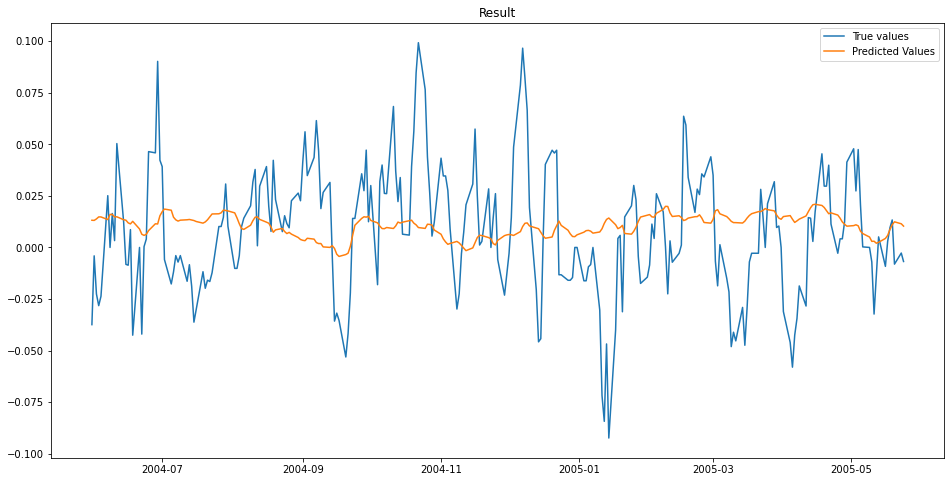


MSE: 0.0010004133312144926

Iteration No: 50 ended. Search finished for the next optimal point.
Time taken: 10.1466
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 51 started. Searching for the next optimal point.

learning rate: 0.00035696221331054826
num_input_nodes: 60
dropout: 0.15871059674378532
sequence_length : 152
batch_size: 205



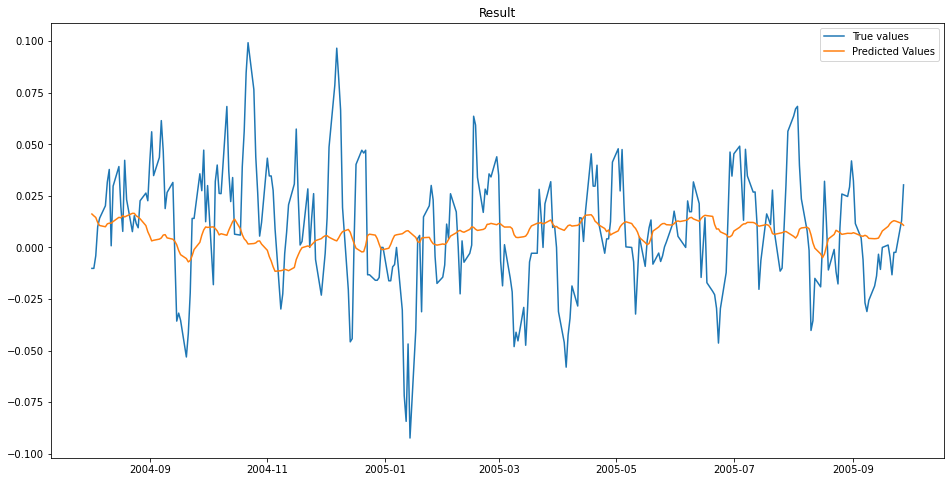


MSE: 0.000903632667385242

Iteration No: 51 ended. Search finished for the next optimal point.
Time taken: 14.4013
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 52 started. Searching for the next optimal point.

learning rate: 0.0001188409223381412
num_input_nodes: 177
dropout: 0.21891156143998414
sequence_length : 168
batch_size: 175



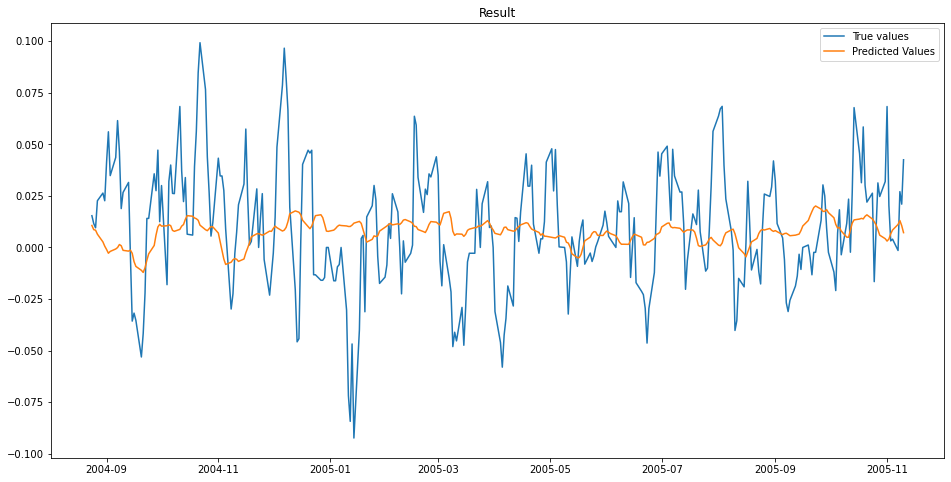


MSE: 0.0008931203285876349

Iteration No: 52 ended. Search finished for the next optimal point.
Time taken: 28.2340
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 53 started. Searching for the next optimal point.

learning rate: 0.0033298625298422277
num_input_nodes: 48
dropout: 0.19978580796758103
sequence_length : 124
batch_size: 174



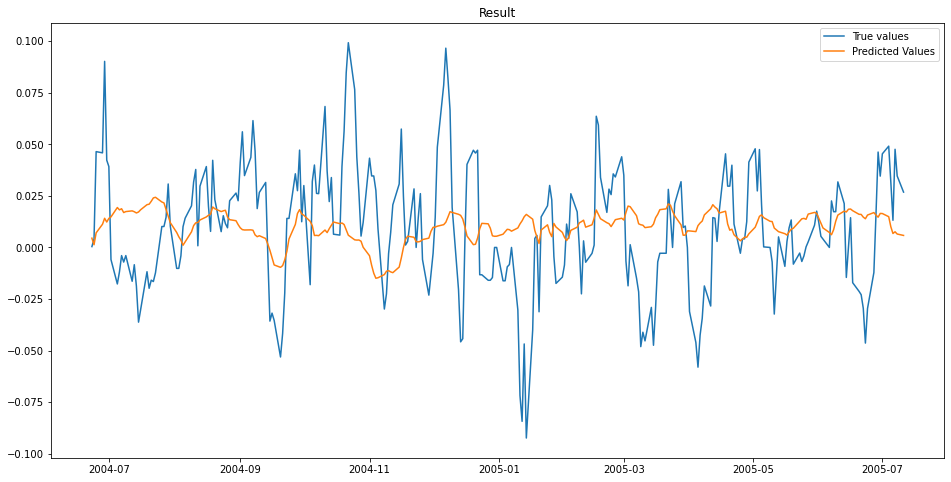


MSE: 0.000989247269689357

Iteration No: 53 ended. Search finished for the next optimal point.
Time taken: 10.2977
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 54 started. Searching for the next optimal point.

learning rate: 0.00036027060747977226
num_input_nodes: 102
dropout: 0.04395199891507324
sequence_length : 157
batch_size: 103



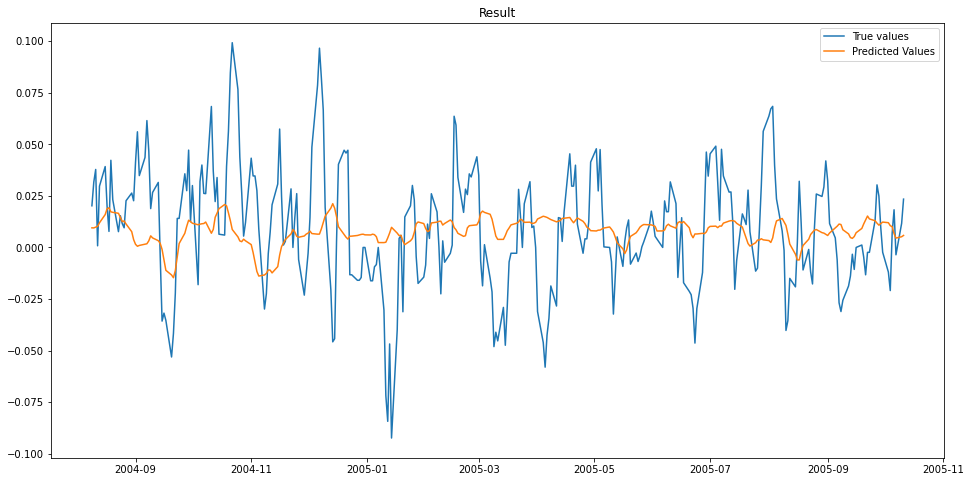


MSE: 0.0008891836768058053

Iteration No: 54 ended. Search finished for the next optimal point.
Time taken: 18.6160
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 55 started. Searching for the next optimal point.

learning rate: 0.0007041754428186566
num_input_nodes: 24
dropout: 0.1808445203832612
sequence_length : 193
batch_size: 13



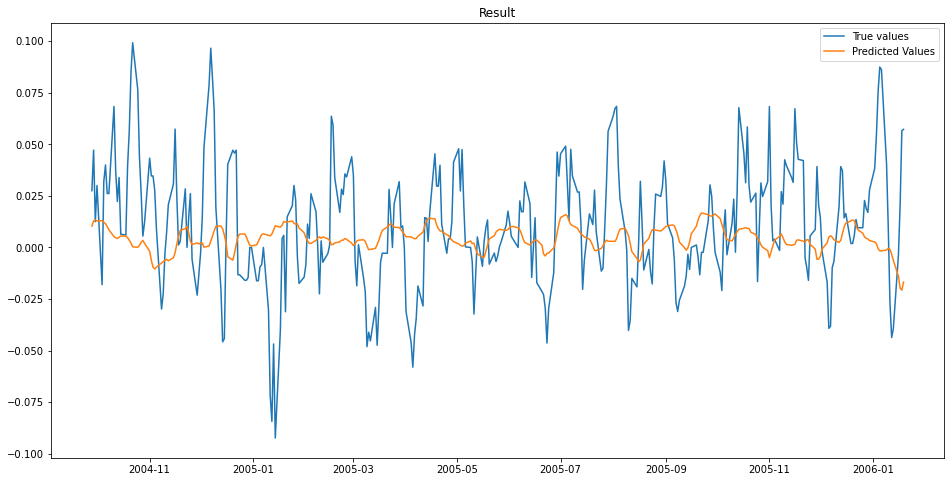


MSE: 0.0009780628347015865

Iteration No: 55 ended. Search finished for the next optimal point.
Time taken: 37.3078
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 56 started. Searching for the next optimal point.

learning rate: 0.009919908572416309
num_input_nodes: 75
dropout: 0.06993407026048219
sequence_length : 116
batch_size: 224



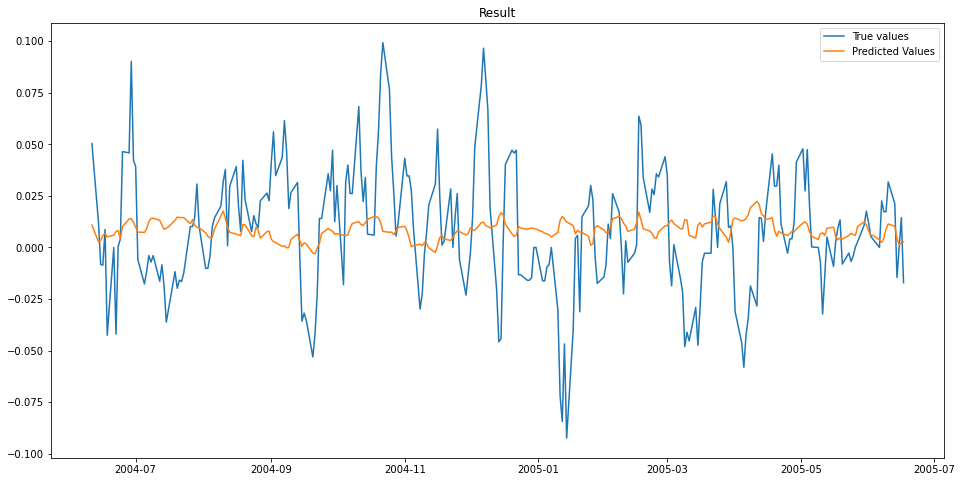


MSE: 0.0009423413068171367

Iteration No: 56 ended. Search finished for the next optimal point.
Time taken: 11.7129
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 57 started. Searching for the next optimal point.

learning rate: 0.0001
num_input_nodes: 256
dropout: 0.10458374019108321
sequence_length : 159
batch_size: 1



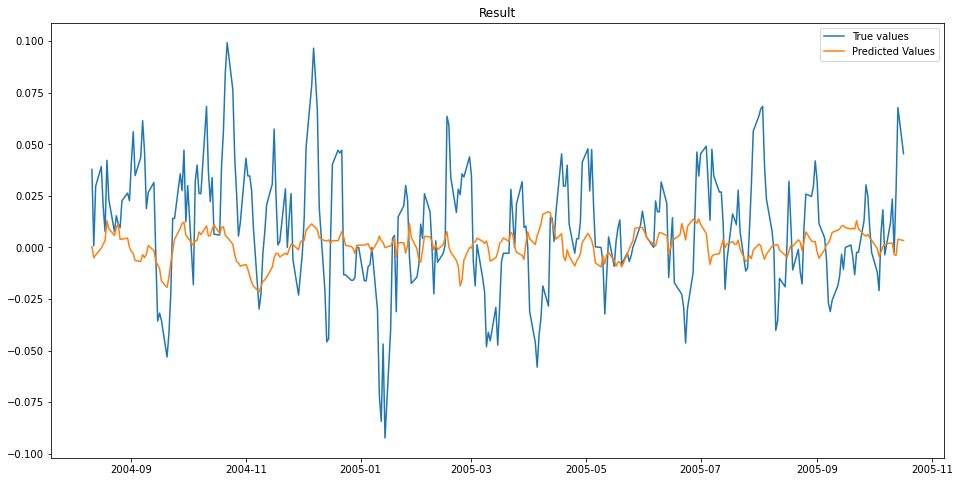


MSE: 0.0009450592144786425

Iteration No: 57 ended. Search finished for the next optimal point.
Time taken: 410.5048
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 58 started. Searching for the next optimal point.

learning rate: 0.0009519885287777707
num_input_nodes: 132
dropout: 0.029560473583090864
sequence_length : 146
batch_size: 176



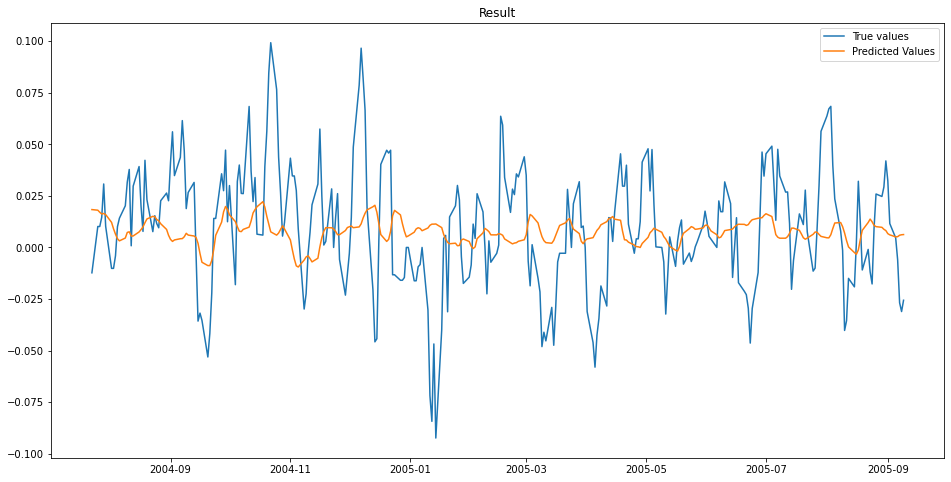


MSE: 0.0009062541308788199

Iteration No: 58 ended. Search finished for the next optimal point.
Time taken: 13.2989
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 59 started. Searching for the next optimal point.

learning rate: 0.000580867106062049
num_input_nodes: 5
dropout: 0.19668041290854066
sequence_length : 154
batch_size: 1



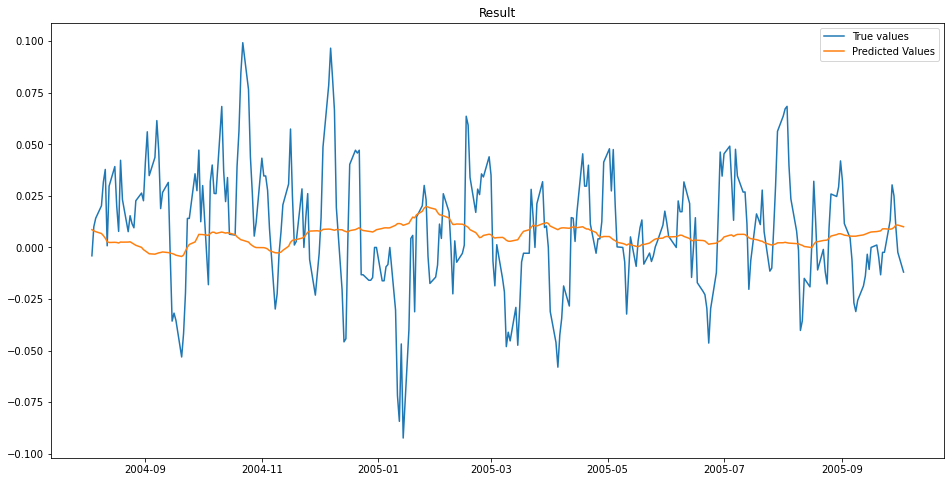


MSE: 0.0009186357500910385

Iteration No: 59 ended. Search finished for the next optimal point.
Time taken: 289.9918
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 60 started. Searching for the next optimal point.

learning rate: 0.00010180274711078338
num_input_nodes: 163
dropout: 0.07920302891584906
sequence_length : 176
batch_size: 158



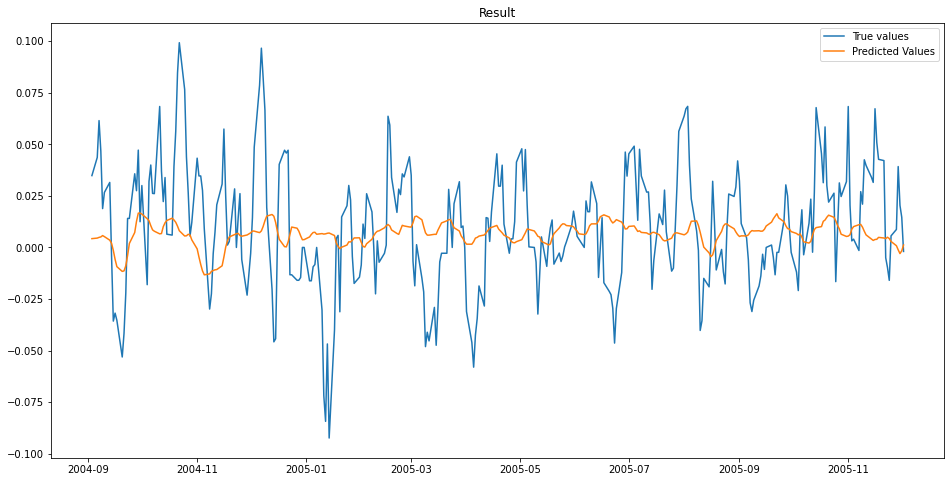


MSE: 0.0008902528197621399

Iteration No: 60 ended. Search finished for the next optimal point.
Time taken: 38.7587
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 61 started. Searching for the next optimal point.

learning rate: 0.004601649422606682
num_input_nodes: 85
dropout: 0.015120516756848643
sequence_length : 148
batch_size: 188



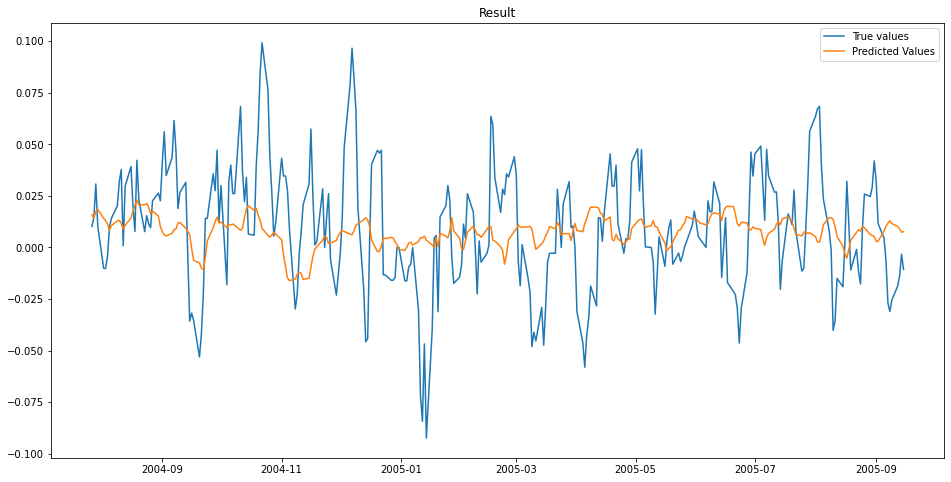


MSE: 0.0009153593363231874

Iteration No: 61 ended. Search finished for the next optimal point.
Time taken: 14.9950
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 62 started. Searching for the next optimal point.

learning rate: 0.003778761170677325
num_input_nodes: 207
dropout: 0.17932400172786384
sequence_length : 169
batch_size: 166



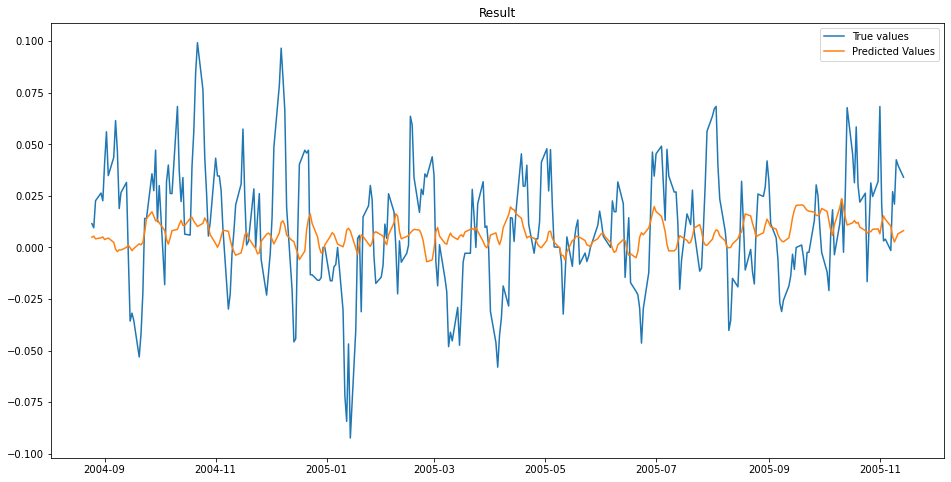


MSE: 0.0008791251291636351

Iteration No: 62 ended. Search finished for the next optimal point.
Time taken: 21.6791
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 63 started. Searching for the next optimal point.

learning rate: 0.0002604040124166736
num_input_nodes: 252
dropout: 0.16135624728161582
sequence_length : 187
batch_size: 1



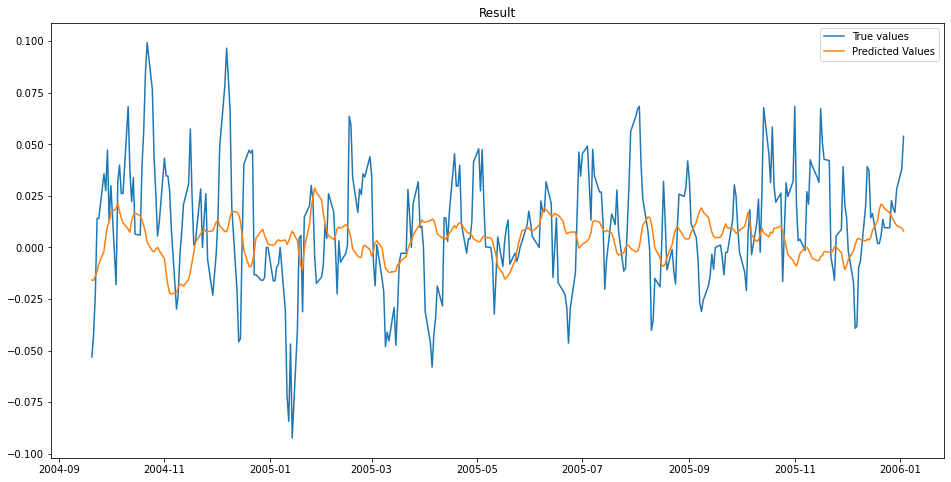


MSE: 0.0009660942624818139

Iteration No: 63 ended. Search finished for the next optimal point.
Time taken: 469.2988
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 64 started. Searching for the next optimal point.

learning rate: 0.01
num_input_nodes: 64
dropout: 0.1292114456819509
sequence_length : 185
batch_size: 231



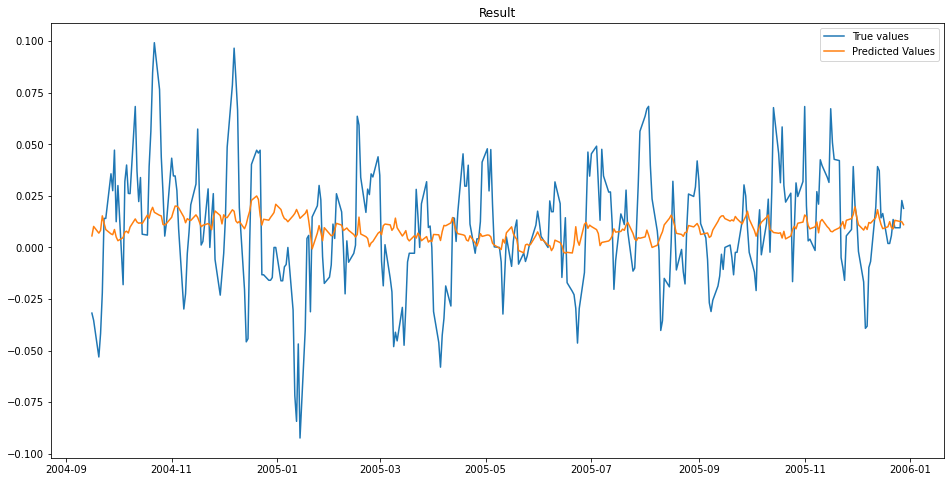


MSE: 0.0008491549951823682

Iteration No: 64 ended. Search finished for the next optimal point.
Time taken: 11.7295
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 65 started. Searching for the next optimal point.

learning rate: 0.01
num_input_nodes: 77
dropout: 0.06012348984264814
sequence_length : 186
batch_size: 15



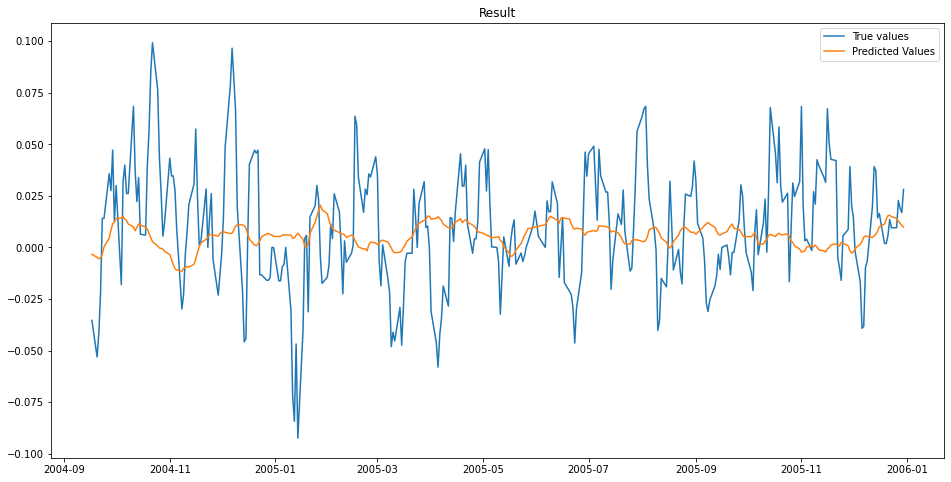


MSE: 0.0009028829221883901

Iteration No: 65 ended. Search finished for the next optimal point.
Time taken: 35.5322
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 66 started. Searching for the next optimal point.

learning rate: 0.00011358736782839775
num_input_nodes: 5
dropout: 0.029325532461649
sequence_length : 184
batch_size: 209



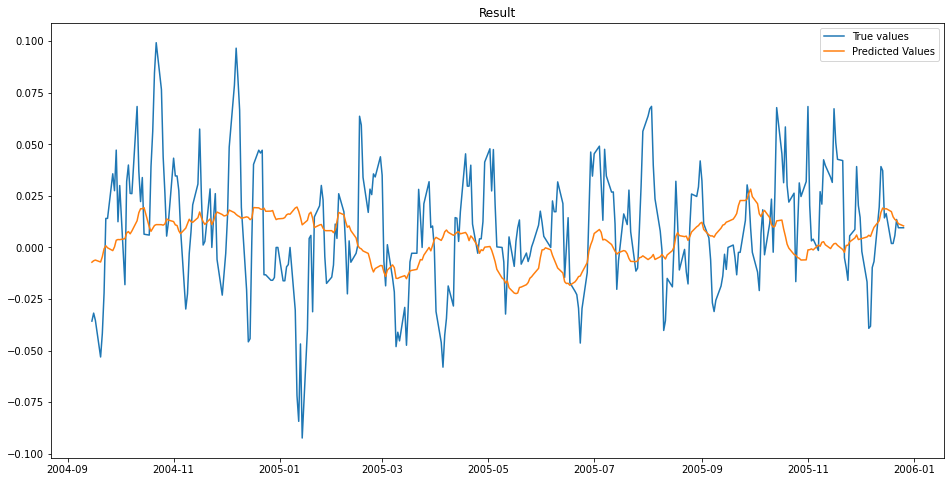


MSE: 0.0009153876174553971

Iteration No: 66 ended. Search finished for the next optimal point.
Time taken: 32.0203
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 67 started. Searching for the next optimal point.

learning rate: 0.00014476706831299192
num_input_nodes: 203
dropout: 0.14726485363284803
sequence_length : 200
batch_size: 166



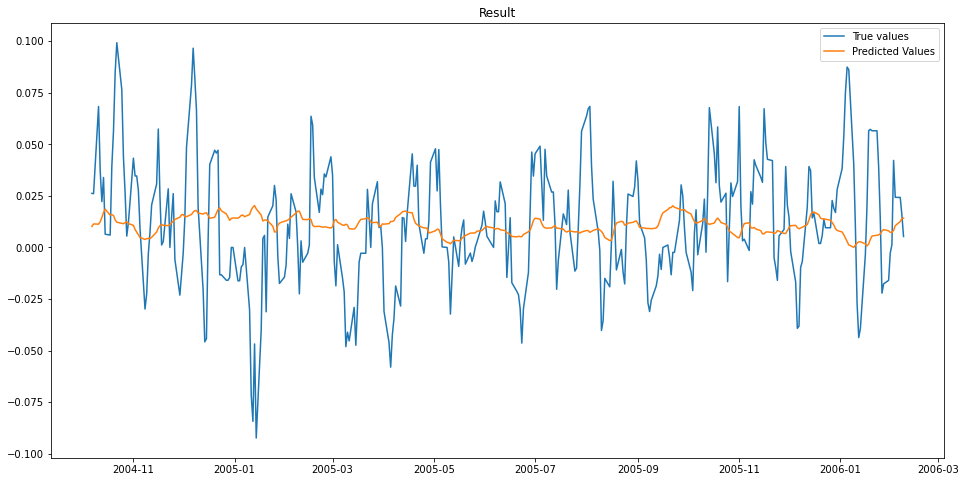


MSE: 0.0009207992532571518

Iteration No: 67 ended. Search finished for the next optimal point.
Time taken: 35.5968
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 68 started. Searching for the next optimal point.

learning rate: 0.0001703614412866861
num_input_nodes: 254
dropout: 0.19476335722100108
sequence_length : 100
batch_size: 245



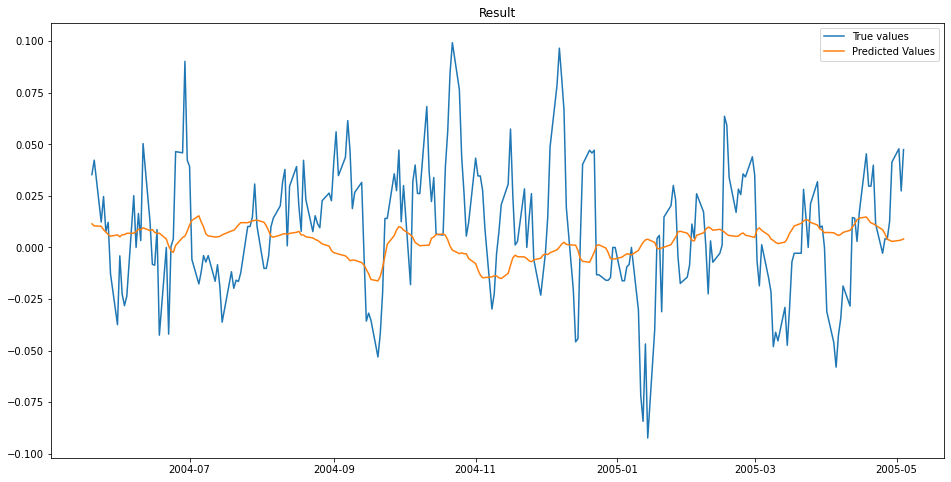


MSE: 0.0010626172365906968

Iteration No: 68 ended. Search finished for the next optimal point.
Time taken: 16.3380
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 69 started. Searching for the next optimal point.

learning rate: 0.00022898042712449123
num_input_nodes: 142
dropout: 0.017850679904295817
sequence_length : 167
batch_size: 36



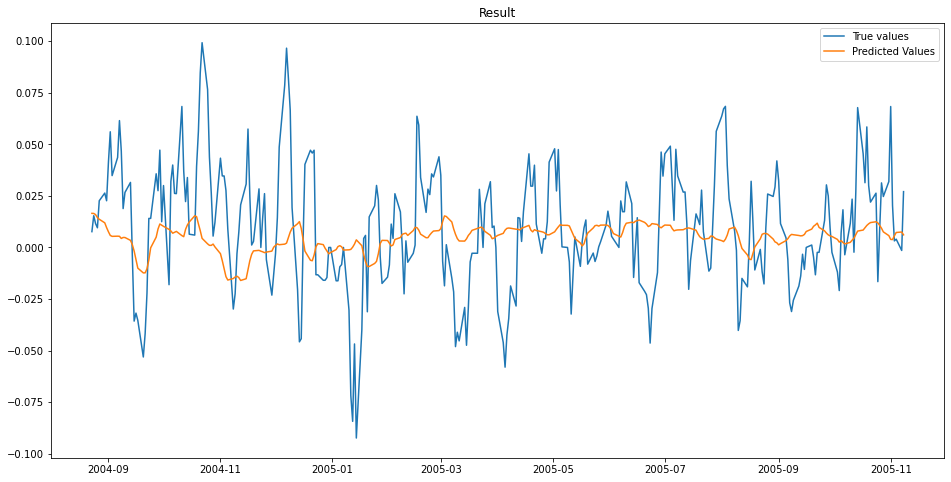


MSE: 0.0009061081868619448

Iteration No: 69 ended. Search finished for the next optimal point.
Time taken: 32.7873
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 70 started. Searching for the next optimal point.

learning rate: 0.00415313472997089
num_input_nodes: 163
dropout: 0.011486325079716865
sequence_length : 174
batch_size: 106



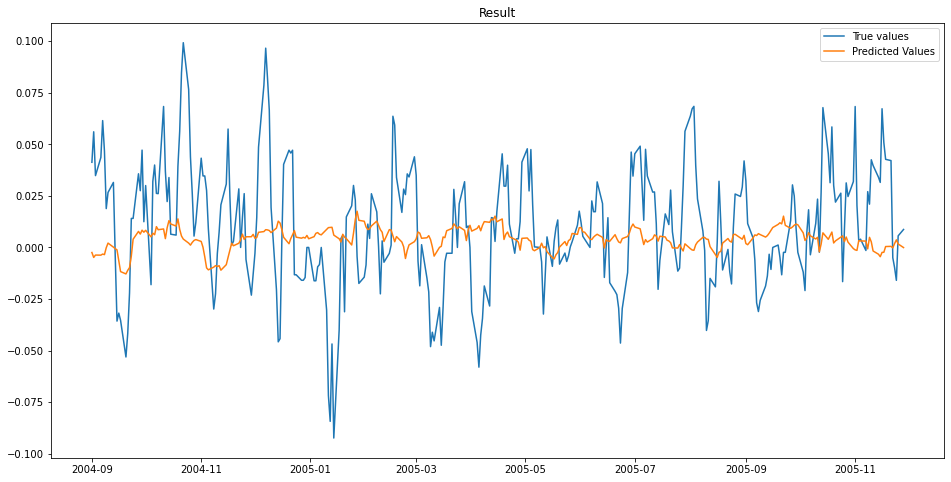


MSE: 0.0009619227132933967

Iteration No: 70 ended. Search finished for the next optimal point.
Time taken: 22.1278
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 71 started. Searching for the next optimal point.

learning rate: 0.01
num_input_nodes: 5
dropout: 0.22031379524278594
sequence_length : 187
batch_size: 103



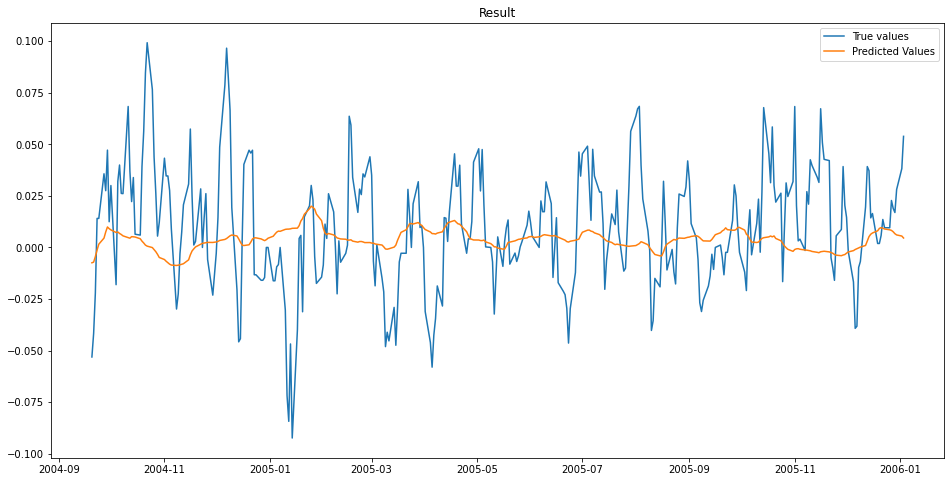


MSE: 0.0009091724081219359

Iteration No: 71 ended. Search finished for the next optimal point.
Time taken: 17.6061
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 72 started. Searching for the next optimal point.

learning rate: 0.001934714882000995
num_input_nodes: 14
dropout: 0.1496472888041074
sequence_length : 176
batch_size: 40



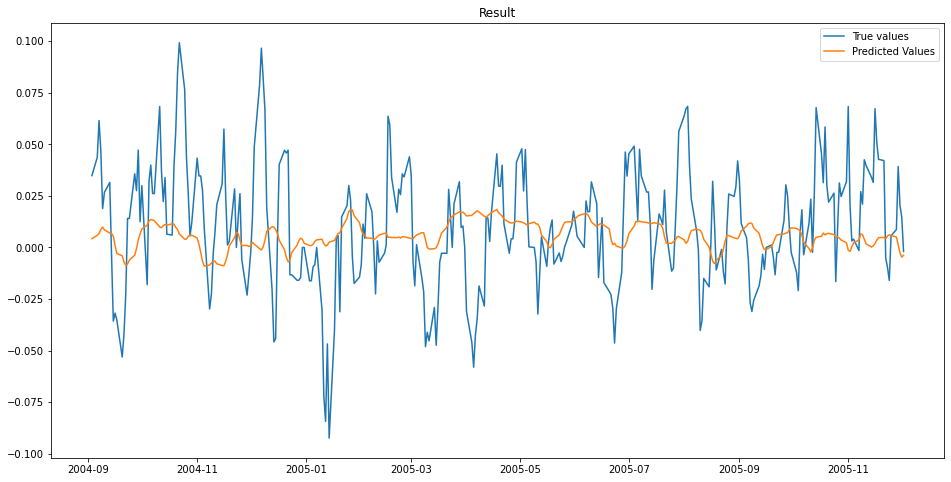


MSE: 0.0009234900713534057

Iteration No: 72 ended. Search finished for the next optimal point.
Time taken: 23.6843
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 73 started. Searching for the next optimal point.

learning rate: 0.0001960116571995673
num_input_nodes: 238
dropout: 0.016410823138326067
sequence_length : 128
batch_size: 216



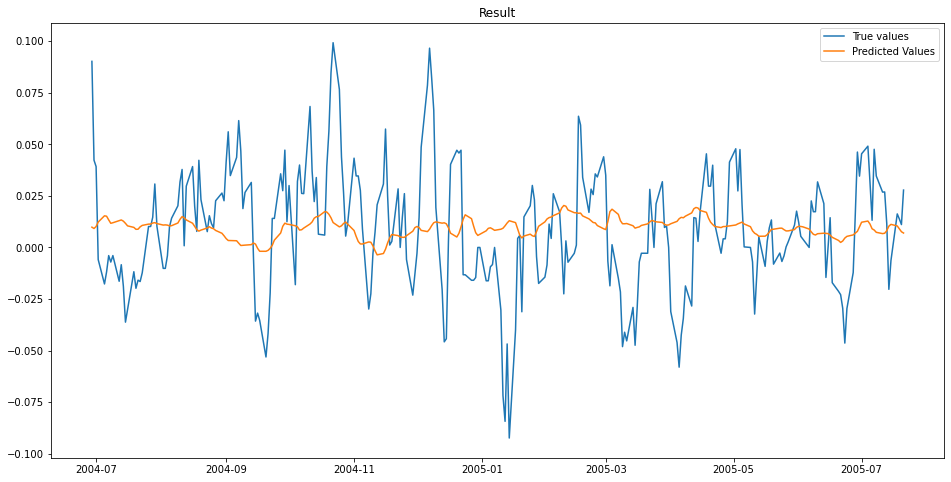


MSE: 0.000923439169919262

Iteration No: 73 ended. Search finished for the next optimal point.
Time taken: 18.0313
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 74 started. Searching for the next optimal point.

learning rate: 0.0016564469777783752
num_input_nodes: 168
dropout: 0.10476539484311784
sequence_length : 179
batch_size: 71



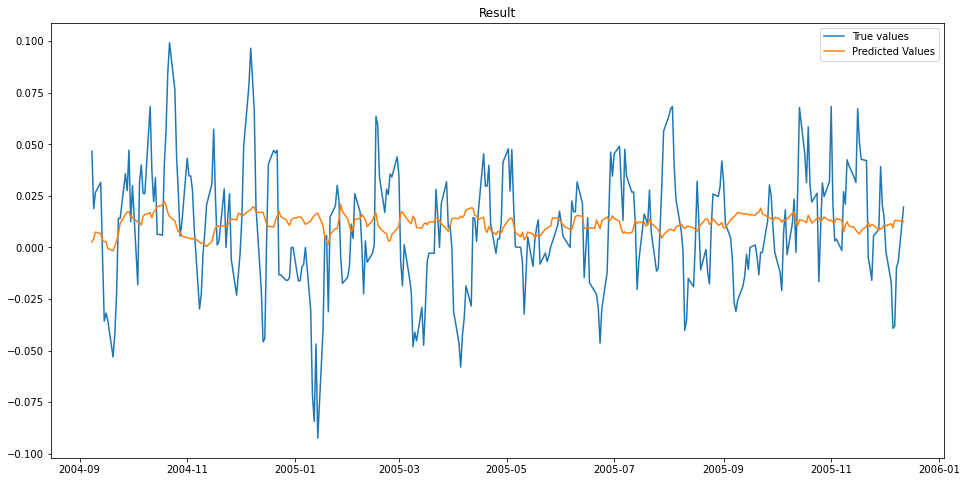


MSE: 0.0008896873446768972

Iteration No: 74 ended. Search finished for the next optimal point.
Time taken: 21.9323
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 75 started. Searching for the next optimal point.

learning rate: 0.00020458807202446572
num_input_nodes: 88
dropout: 0.2289375289856191
sequence_length : 199
batch_size: 222



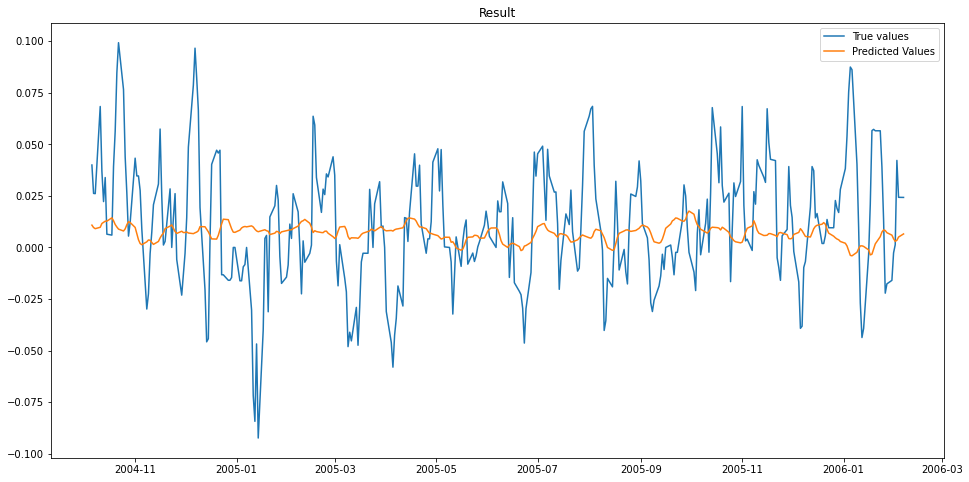


MSE: 0.0009229063242980222

Iteration No: 75 ended. Search finished for the next optimal point.
Time taken: 17.4512
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 76 started. Searching for the next optimal point.

learning rate: 0.00936354814193516
num_input_nodes: 58
dropout: 0.018650182734457125
sequence_length : 177
batch_size: 155



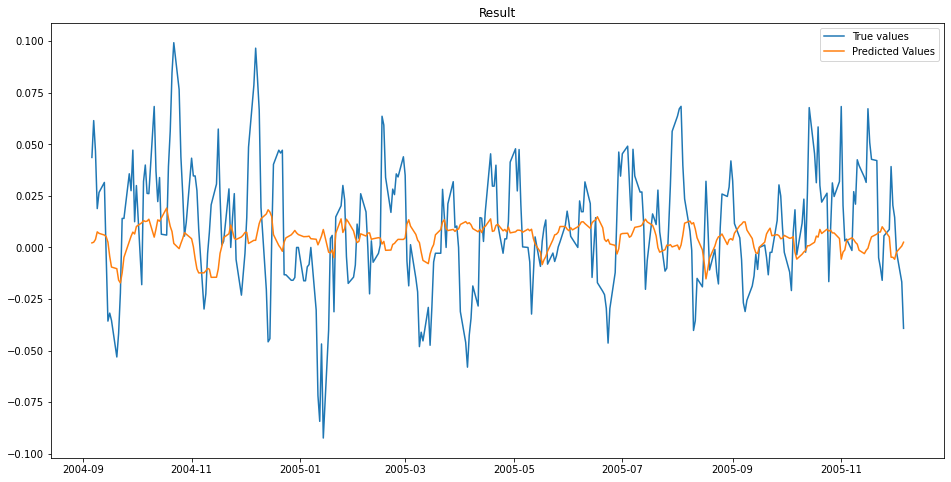


MSE: 0.000954561444989486

Iteration No: 76 ended. Search finished for the next optimal point.
Time taken: 14.9401
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 77 started. Searching for the next optimal point.

learning rate: 0.0006277318630327672
num_input_nodes: 170
dropout: 0.17310481009819254
sequence_length : 195
batch_size: 179



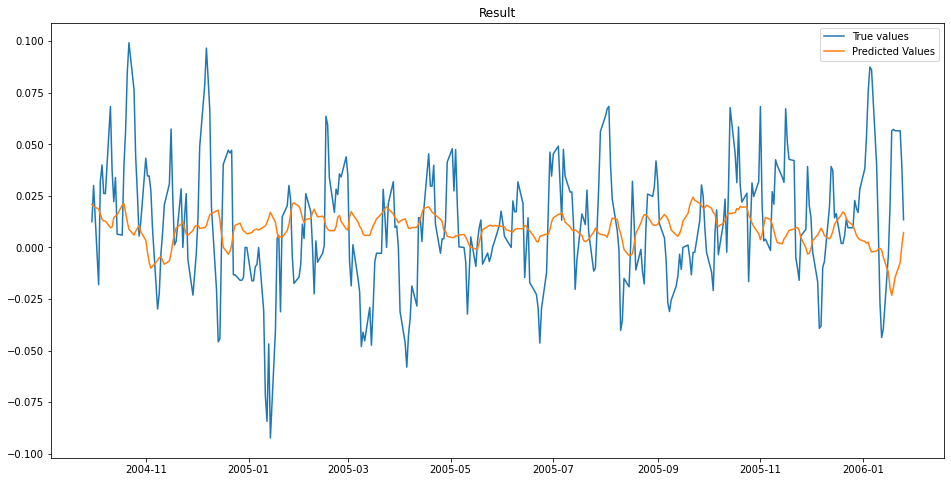


MSE: 0.0009961233314160517

Iteration No: 77 ended. Search finished for the next optimal point.
Time taken: 20.0065
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 78 started. Searching for the next optimal point.

learning rate: 0.0006216653829877448
num_input_nodes: 117
dropout: 0.02517160087720311
sequence_length : 132
batch_size: 235



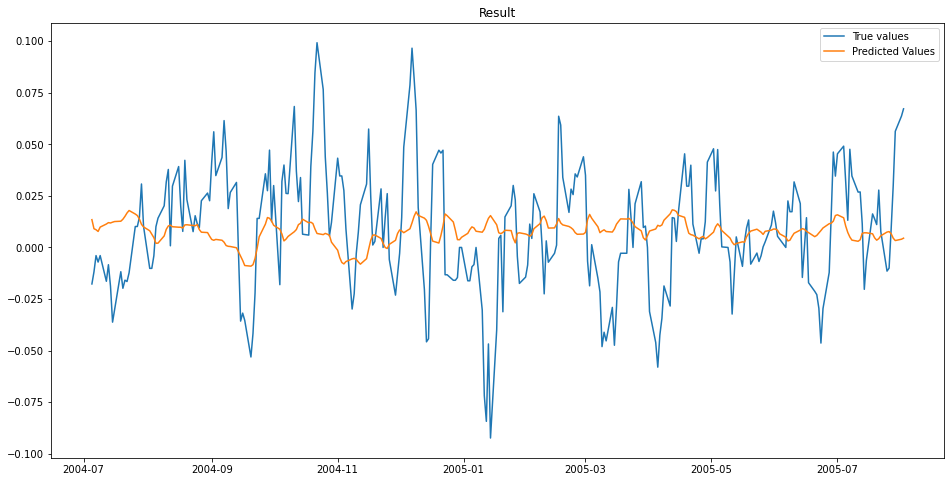


MSE: 0.0009317921246926172

Iteration No: 78 ended. Search finished for the next optimal point.
Time taken: 15.1607
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 79 started. Searching for the next optimal point.

learning rate: 0.0024768316121782804
num_input_nodes: 166
dropout: 0.015770349364863216
sequence_length : 128
batch_size: 83



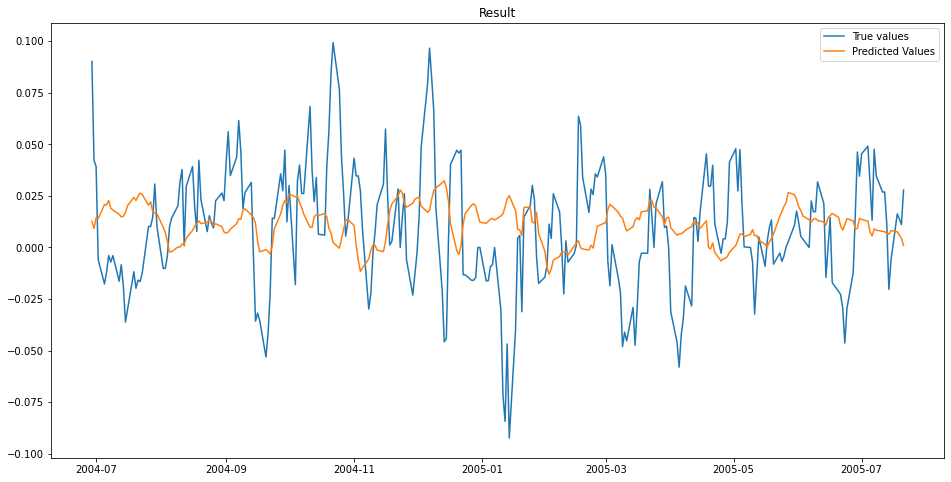


MSE: 0.0010566465430550157

Iteration No: 79 ended. Search finished for the next optimal point.
Time taken: 23.8058
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 80 started. Searching for the next optimal point.

learning rate: 0.0011848875333369338
num_input_nodes: 148
dropout: 0.1820547760128416
sequence_length : 186
batch_size: 112



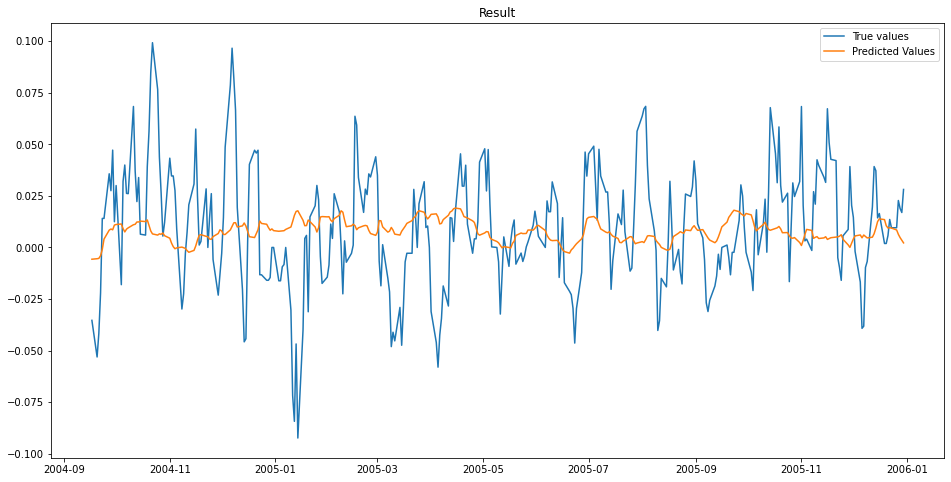


MSE: 0.000875424887970918

Iteration No: 80 ended. Search finished for the next optimal point.
Time taken: 15.1737
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 81 started. Searching for the next optimal point.

learning rate: 0.001853537661167109
num_input_nodes: 7
dropout: 0.21209418471480662
sequence_length : 184
batch_size: 221



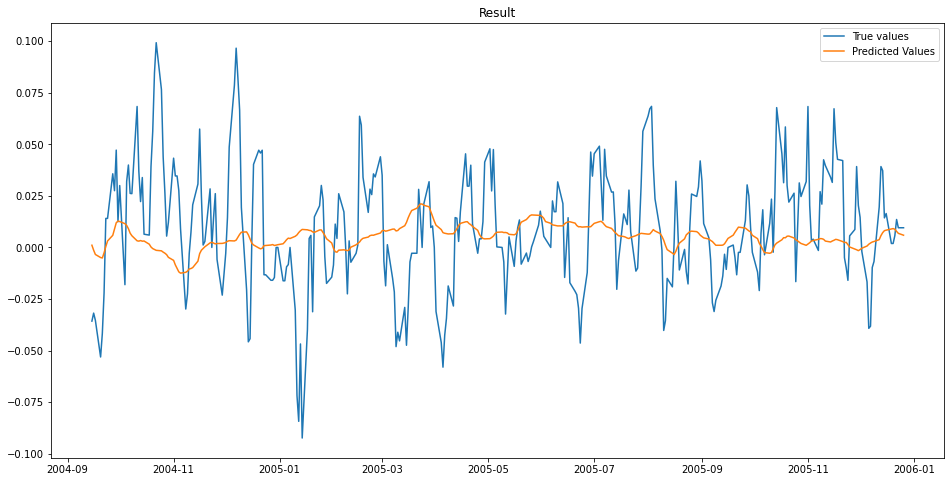


MSE: 0.0009184283165410268

Iteration No: 81 ended. Search finished for the next optimal point.
Time taken: 19.2148
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 82 started. Searching for the next optimal point.

learning rate: 0.002827388517269168
num_input_nodes: 209
dropout: 0.17279149398322147
sequence_length : 117
batch_size: 247



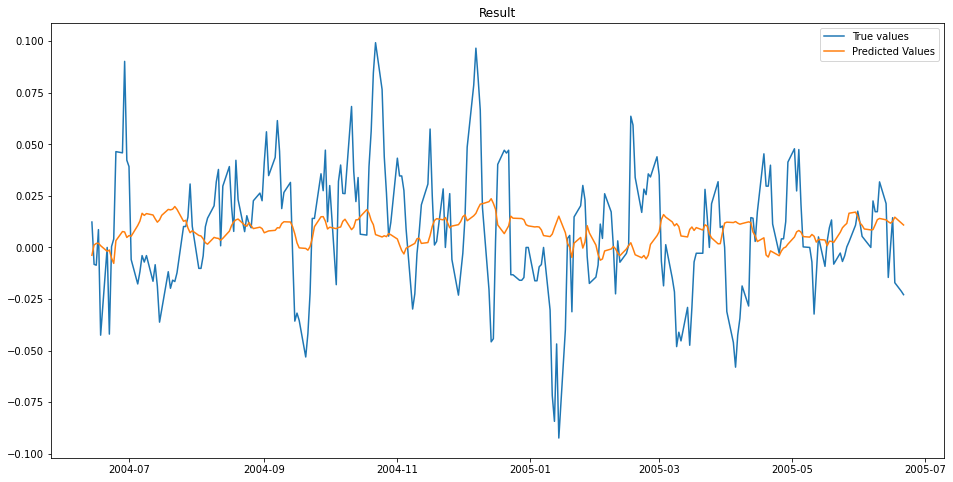


MSE: 0.0009754841971174356

Iteration No: 82 ended. Search finished for the next optimal point.
Time taken: 20.0975
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 83 started. Searching for the next optimal point.

learning rate: 0.0010175461262211167
num_input_nodes: 159
dropout: 0.21268918654950092
sequence_length : 117
batch_size: 96



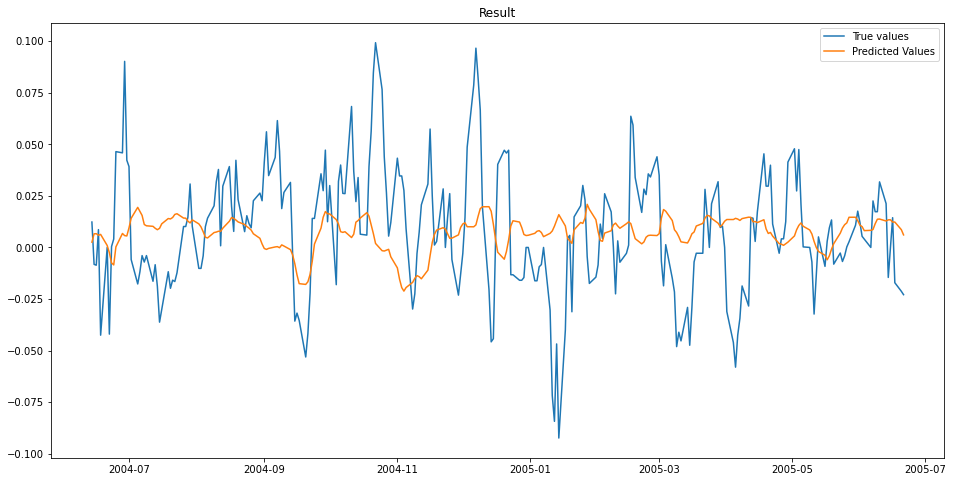


MSE: 0.0010019630402596678

Iteration No: 83 ended. Search finished for the next optimal point.
Time taken: 20.7465
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 84 started. Searching for the next optimal point.

learning rate: 0.0019620658397930023
num_input_nodes: 247
dropout: 0.0796603052293783
sequence_length : 141
batch_size: 82



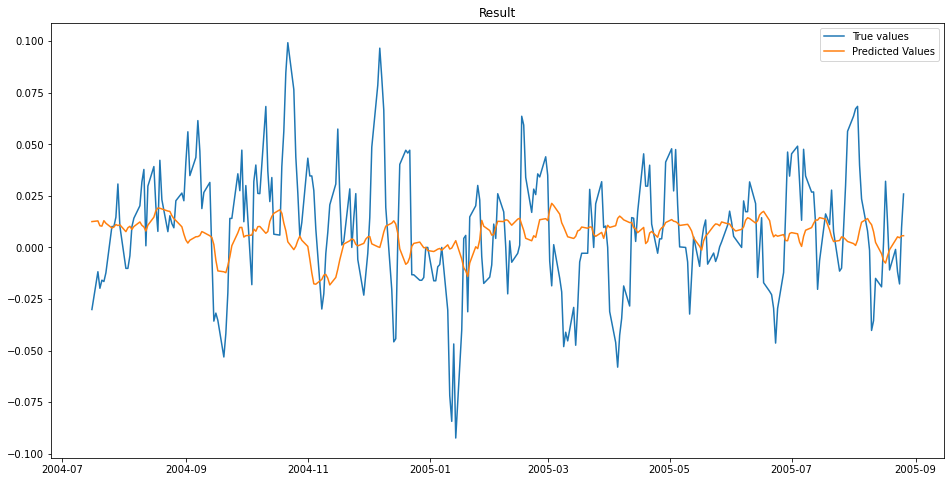


MSE: 0.00095211384166651

Iteration No: 84 ended. Search finished for the next optimal point.
Time taken: 25.5270
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 85 started. Searching for the next optimal point.

learning rate: 0.008043191210903316
num_input_nodes: 42
dropout: 0.22844898929603968
sequence_length : 113
batch_size: 68



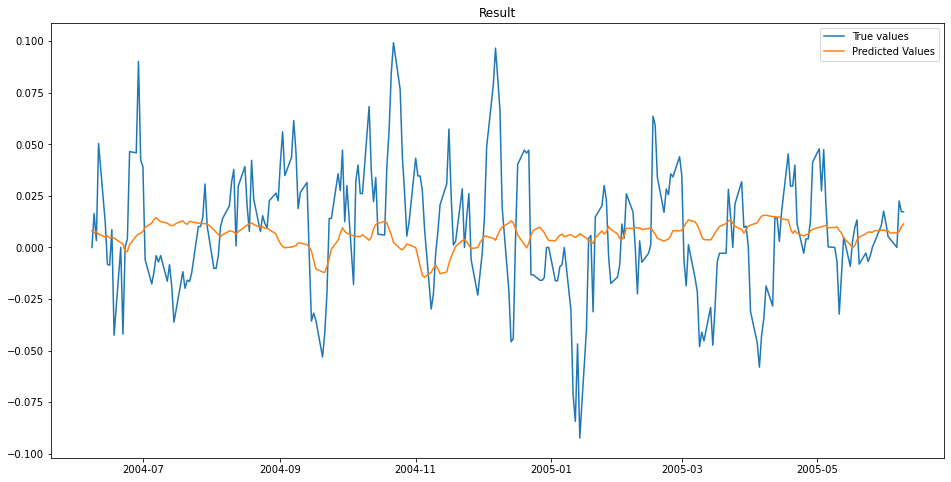


MSE: 0.0009830254717990822

Iteration No: 85 ended. Search finished for the next optimal point.
Time taken: 14.3990
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 86 started. Searching for the next optimal point.

learning rate: 0.0038009778724640993
num_input_nodes: 232
dropout: 0.12491961823757344
sequence_length : 136
batch_size: 71



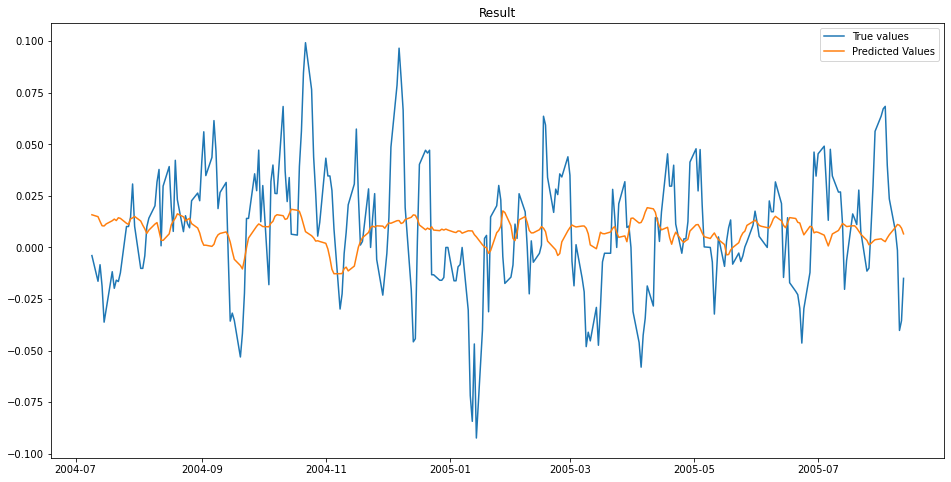


MSE: 0.0009454566137385762

Iteration No: 86 ended. Search finished for the next optimal point.
Time taken: 21.1633
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 87 started. Searching for the next optimal point.

learning rate: 0.005333059284877444
num_input_nodes: 28
dropout: 0.10729957267690465
sequence_length : 105
batch_size: 246



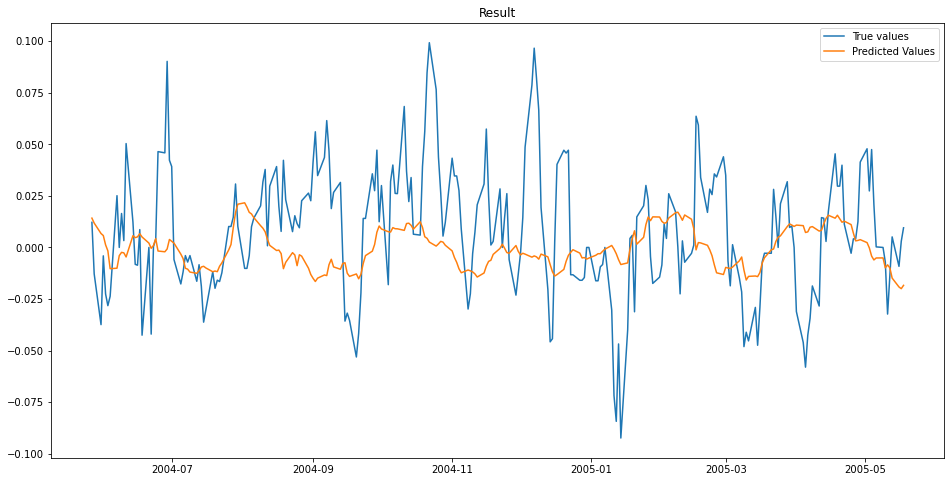


MSE: 0.0010631624971999991

Iteration No: 87 ended. Search finished for the next optimal point.
Time taken: 9.7244
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 88 started. Searching for the next optimal point.

learning rate: 0.0001477443660864128
num_input_nodes: 152
dropout: 0.13384018712408904
sequence_length : 181
batch_size: 59



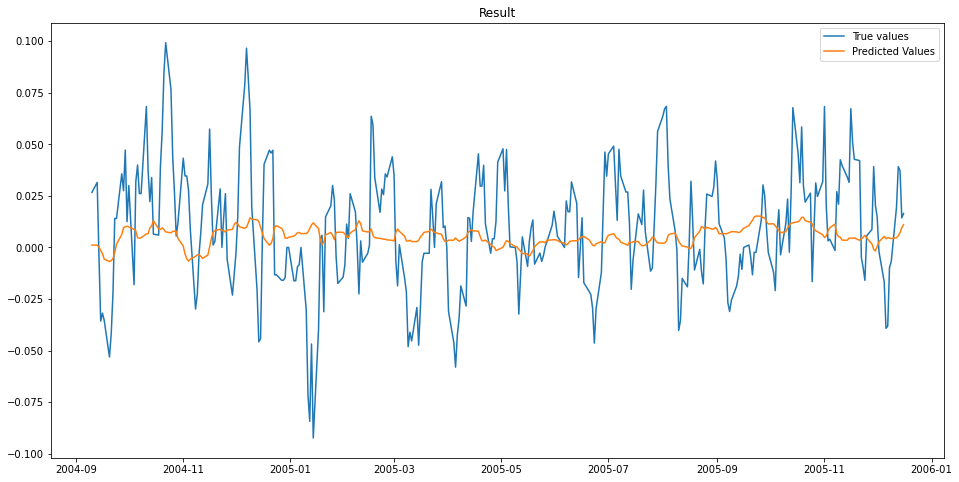


MSE: 0.0008805615078250476

Iteration No: 88 ended. Search finished for the next optimal point.
Time taken: 21.5264
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 89 started. Searching for the next optimal point.

learning rate: 0.004873061106915806
num_input_nodes: 179
dropout: 0.0
sequence_length : 184
batch_size: 136



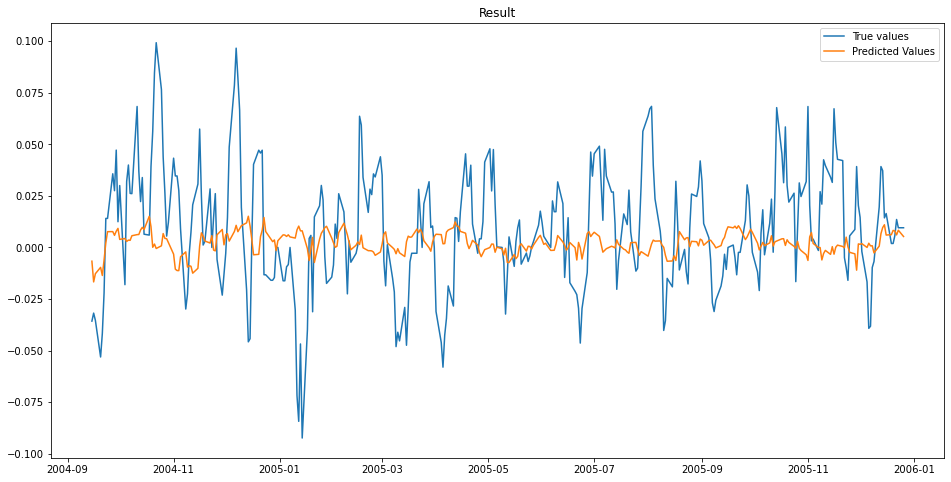


MSE: 0.0009360104907431225

Iteration No: 89 ended. Search finished for the next optimal point.
Time taken: 24.4046
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 90 started. Searching for the next optimal point.

learning rate: 0.003733473307491649
num_input_nodes: 106
dropout: 0.1397351285801814
sequence_length : 131
batch_size: 27



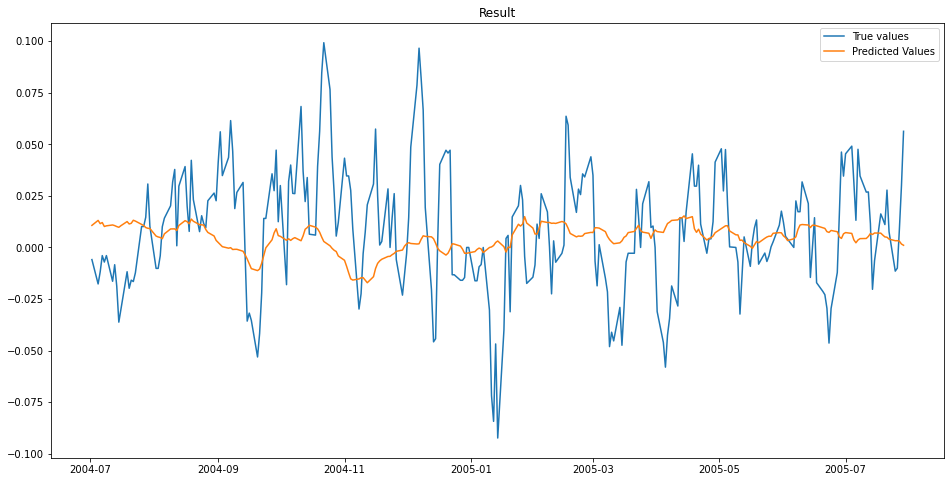


MSE: 0.0009212733027877136

Iteration No: 90 ended. Search finished for the next optimal point.
Time taken: 34.5236
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 91 started. Searching for the next optimal point.

learning rate: 0.00977365393015355
num_input_nodes: 150
dropout: 0.16391436406807167
sequence_length : 186
batch_size: 158



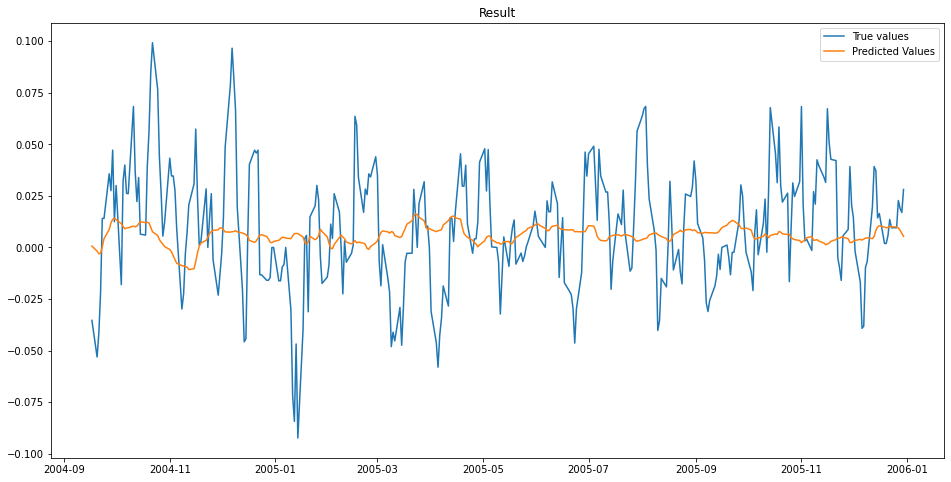


MSE: 0.0008778272335699455

Iteration No: 91 ended. Search finished for the next optimal point.
Time taken: 19.4315
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 92 started. Searching for the next optimal point.

learning rate: 0.0001
num_input_nodes: 227
dropout: 0.15320637391275602
sequence_length : 155
batch_size: 59



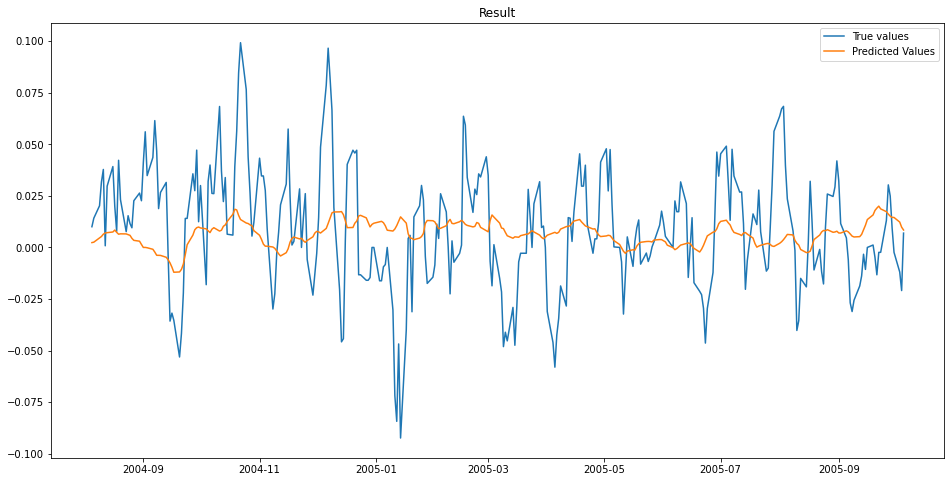


MSE: 0.0008776810594718017

Iteration No: 92 ended. Search finished for the next optimal point.
Time taken: 29.8973
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 93 started. Searching for the next optimal point.

learning rate: 0.001454010611221609
num_input_nodes: 52
dropout: 0.09308903147973126
sequence_length : 116
batch_size: 182



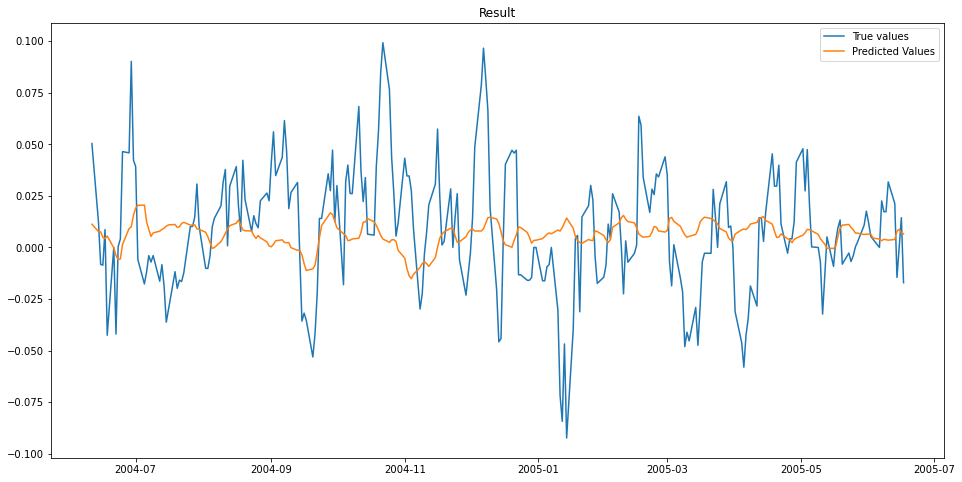


MSE: 0.0009581096561415549

Iteration No: 93 ended. Search finished for the next optimal point.
Time taken: 9.9666
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 94 started. Searching for the next optimal point.

learning rate: 0.00013922483491784666
num_input_nodes: 57
dropout: 0.00809265959299685
sequence_length : 154
batch_size: 51



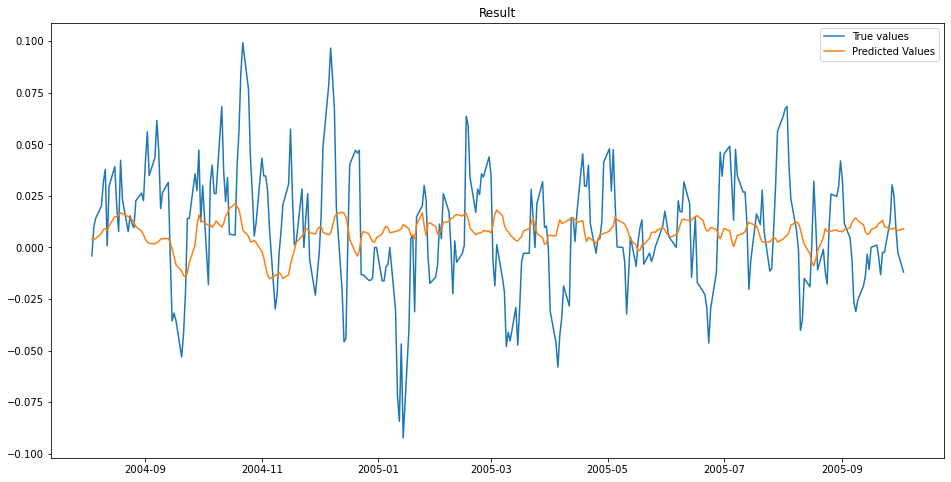


MSE: 0.0009179966876084485

Iteration No: 94 ended. Search finished for the next optimal point.
Time taken: 40.8345
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 95 started. Searching for the next optimal point.

learning rate: 0.01
num_input_nodes: 49
dropout: 0.19745140915525045
sequence_length : 186
batch_size: 42



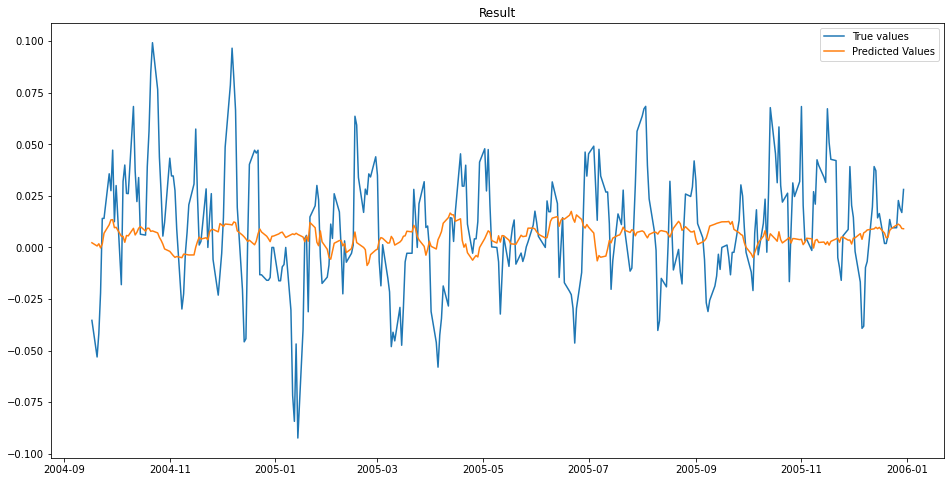


MSE: 0.00088525530174661

Iteration No: 95 ended. Search finished for the next optimal point.
Time taken: 24.8198
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 96 started. Searching for the next optimal point.

learning rate: 0.01
num_input_nodes: 122
dropout: 0.19392044956444604
sequence_length : 186
batch_size: 206



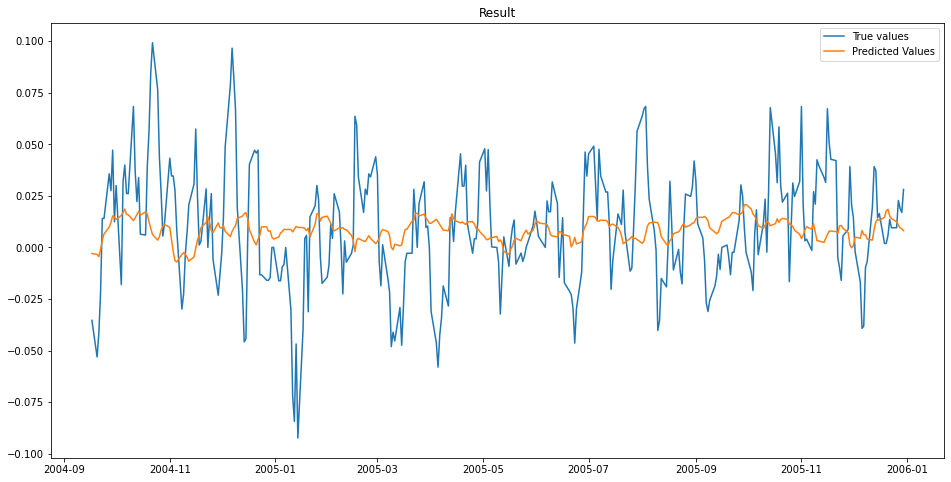


MSE: 0.0008589003467018316

Iteration No: 96 ended. Search finished for the next optimal point.
Time taken: 16.6521
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 97 started. Searching for the next optimal point.

learning rate: 0.0002890880806223456
num_input_nodes: 237
dropout: 0.12307850504510529
sequence_length : 160
batch_size: 232



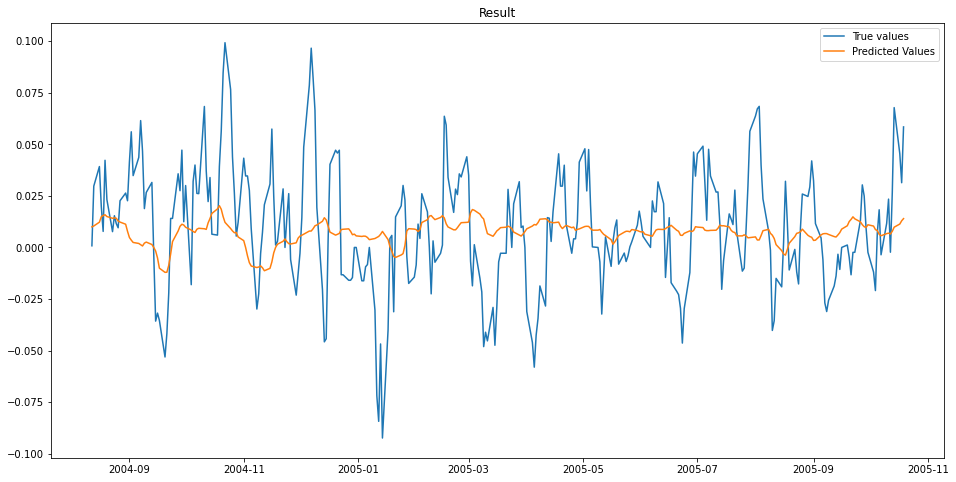


MSE: 0.0008796282065517831

Iteration No: 97 ended. Search finished for the next optimal point.
Time taken: 21.7394
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 98 started. Searching for the next optimal point.

learning rate: 0.01
num_input_nodes: 26
dropout: 0.031910323637419614
sequence_length : 187
batch_size: 241



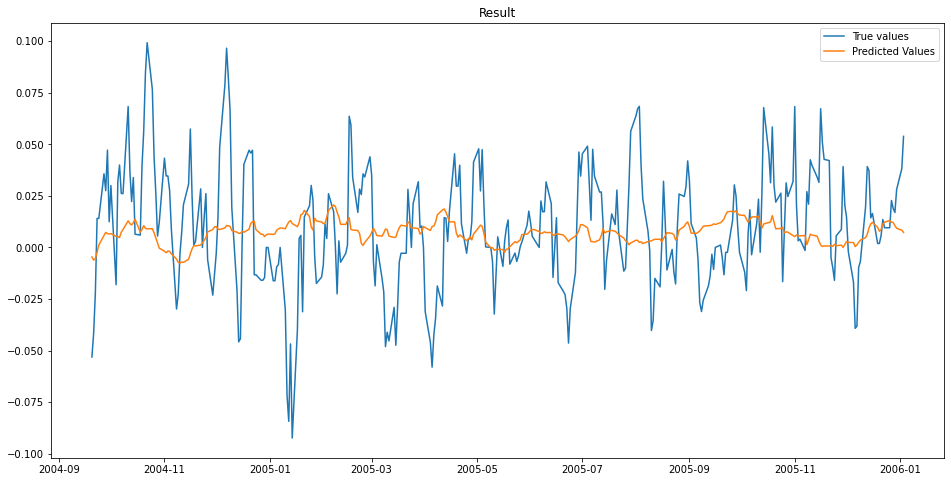


MSE: 0.0008680990494925357

Iteration No: 98 ended. Search finished for the next optimal point.
Time taken: 12.3330
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 99 started. Searching for the next optimal point.

learning rate: 0.01
num_input_nodes: 242
dropout: 0.020901609583281383
sequence_length : 187
batch_size: 161



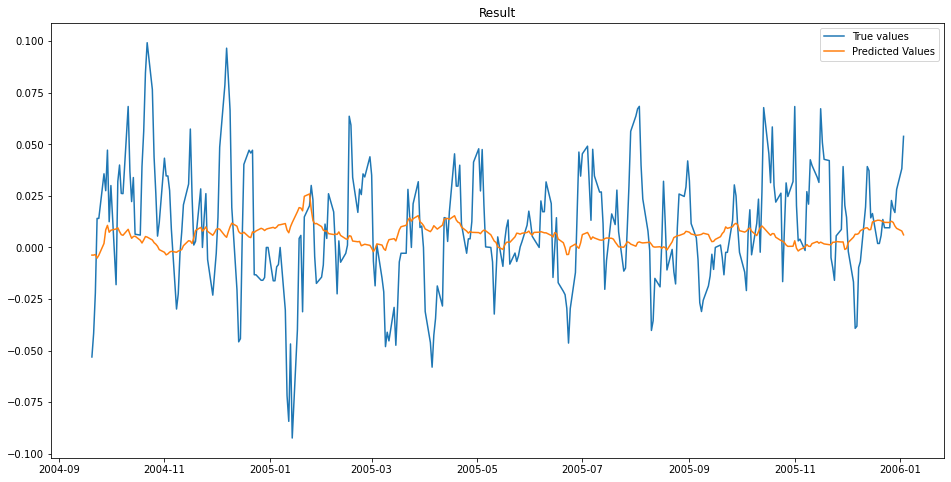


MSE: 0.00088270240800579

Iteration No: 99 ended. Search finished for the next optimal point.
Time taken: 22.2137
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 100 started. Searching for the next optimal point.

learning rate: 0.00011721775002593032
num_input_nodes: 39
dropout: 0.12976722869907892
sequence_length : 174
batch_size: 136



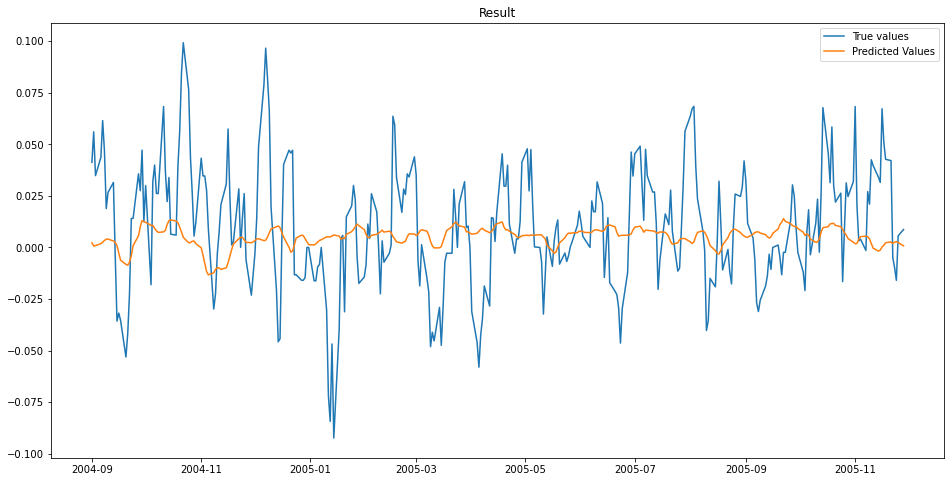


MSE: 0.0009233272412861499

Iteration No: 100 ended. Search finished for the next optimal point.
Time taken: 31.9022
Function value obtained: 0.0009
Current minimum: 0.0008


In [10]:
gp_result = gp_minimize(func=fitness,
                            dimensions=dimensions,
                            n_jobs=-1,
                            n_random_starts=10,
                            verbose=True,
                            x0=default_parameters,
                            random_state=randseed)

**Summary of configurations and results**

In [11]:
res = pd.concat([pd.DataFrame(gp_result.x_iters, columns = ['learning_rate', 'num_input_nodes', 'dropout', 'sequencelength', 'batch_size']),(pd.Series(gp_result.func_vals, name="mse"))], axis=1)
res = res.sort_values(by='mse')
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(res)

,learning_rate,num_input_nodes,dropout,sequencelength,batch_size,mse
21,0.000641,141,0.156257,187,30,0.000840
44,0.002576,217,0.180083,187,33,0.000843
42,0.010000,105,0.000000,187,1,0.000843
48,0.010000,5,0.067261,186,1,0.000848
63,0.010000,64,0.129211,185,231,0.000849
46,0.000116,92,0.197014,157,26,0.000851
95,0.010000,122,0.193920,186,206,0.000859
35,0.000100,52,0.250000,187,23,0.000860
97,0.010000,26,0.031910,187,241,0.000868
79,0.001185,148,0.182055,186,112,0.000875
